# **Installing Libraries**

In [ ]:
pip install git+https://github.com/google-research/torchsde.git

  Cloning https://github.com/google-research/torchsde.git to /tmp/pip-req-build-gi1nu_iu
  Running command git clone -q https://github.com/google-research/torchsde.git /tmp/pip-req-build-gi1nu_iu
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 25.9MB 118kB/s 
     |████████████████████████████████| 174kB 46.8MB/s 
     |████████████████████████████████| 14.5MB 125kB/s 
  Created wheel for torchsde: filename=torchsde-0.2.1-cp36-none-any.whl size=54172 sha256=2a36ef862c7f1539df586f78cfb45bb41cc571e184c06f8ee557d3f12d027caf
  Stored in directory: /tmp/pip-ephem-wheel-cache-2luos9ay/wheels/31/b5/4b/53c7d7c124c1bbfebd2c5f429ca86b5e59f6cd4718dc0f1229
Successfully built torchsde
ERROR: tensorflow 2.3.0 has requirement numpy<1.19.0,>=1.16.0, but you'll have numpy 1.19.4 which is incompatible.
ERROR: tensorflow 2.3.0 has requirement scipy==1.4.1, but you'll have scipy 1.5.4 whic

# **Importing Libraries**

In [ ]:
import datetime as dt
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
import math
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler, StandardScaler

import argparse
import logging
import os
import time
import random
from collections import namedtuple
from typing import Optional, Union
import torch
import torch.nn.functional as F
import torch.nn.init as init
from torch import nn, optim, distributions
import torch.backends.cudnn as cudnn
import tqdm
from google.colab import files

import torchsde

# **Data Loading**

In [ ]:
data = pd.read_csv('https://raw.githubusercontent.com/adityajaas/CS771A_term_project/master/RELIANCE.csv')
data.set_index(pd.Index(np.linspace(1, len(data.index), len(data.index), dtype = int)))
data['Date']= pd.to_datetime(data['Date']) 
data.head()

,Date,Symbol,Series,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,Trades,Deliverable Volume,%Deliverble
0,2015-01-01,RELIANCE,EQ,891.15,886.3,892.00,883.65,888.00,887.90,887.62,677439,6.013059e+13,16263,286377,0.4227
1,2015-01-02,RELIANCE,EQ,887.90,888.1,896.05,884.30,884.95,885.55,889.39,1675827,1.490461e+14,31269,1048543,0.6257
2,2015-01-05,RELIANCE,EQ,885.55,885.0,890.90,874.10,875.55,875.85,881.88,2309591,2.036781e+14,67035,1393132,0.6032
3,2015-01-06,RELIANCE,EQ,875.85,870.0,873.00,832.00,832.50,836.10,847.60,4258043,3.609133e+14,120767,2353273,0.5527
4,2015-01-07,RELIANCE,EQ,836.10,837.1,858.80,837.00,858.00,854.30,849.81,4736315,4.024972e+14,125939,2885468,0.6092


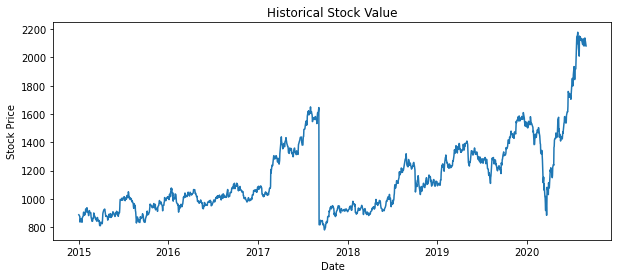

In [ ]:
# Visualize the plot
plt.figure(figsize=(10,4))
plt.plot(data['Date'],data['Close'])
plt.title('Historical Stock Value')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.show()

# **Data Cleaning and Splitting**

In [ ]:
# Create new dataframe with only relevant columns
stk_data = pd.DataFrame(columns = ['Date', 'Open', 'High', 'Low', 'Close'])
stk_data['Date'] = data['Date']
stk_data['Open'] = data['Open']
stk_data['High'] = data['High']
stk_data['Low'] = data['Low']
stk_data['Close'] = data['Close']
stk_data.head()

,Date,Open,High,Low,Close
0,2015-01-01,886.3,892.00,883.65,887.90
1,2015-01-02,888.1,896.05,884.30,885.55
2,2015-01-05,885.0,890.90,874.10,875.85
3,2015-01-06,870.0,873.00,832.00,836.10
4,2015-01-07,837.1,858.80,837.00,854.30


In [ ]:
# Define the training set
percent_training: float = 0.80
num_training_samples = int(np.ceil(percent_training*len(stk_data))) # number of training samples in int
training_set = stk_data.iloc[:num_training_samples, 4:5].values # Extract the Close values for training data

#Define the test data
num_testing_samples: int = len(stk_data) - num_training_samples # number of test samples in int 
testing_set = stk_data.iloc[-num_testing_samples:, 4:5].values # Extract the Close values for test data
print('Training set shape:', training_set.shape, '\n', 'Testing set shape:', testing_set.shape)

Training set shape: (1121, 1) 
 Testing set shape: (280, 1)


**Generting y_train, y_test, t_s**

In [ ]:
# Scale training data
scaler = StandardScaler()
training_set_scaled = scaler.fit_transform(training_set) #2D (num_training_samples, 1)
testing_set_scaled = scaler.transform(testing_set) # 2D ndarray (num_testing_samples, 1)

In [ ]:
sequence_length: int = 22 # Number of x_i for each y_i

x_train = np.array([training_set_scaled[i - sequence_length:i, 0] for i in range(sequence_length, len(training_set_scaled))]) 
x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1])) # 3D training set (num_training_samples, sequence_length, 1) 

x_test = np.array([testing_set_scaled[i - sequence_length:i, 0] for i in range(sequence_length, len(testing_set_scaled))])
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1])) #3D test set (num_testing_samples, sequence_length, 1)

y_train = np.array([training_set_scaled[i, 0] for i in range(sequence_length, len(training_set_scaled))]) # 2D (num_training_samples, 1)
y_test = np.array([testing_set_scaled[i, 0] for i in range(sequence_length, len(testing_set_scaled))]) # 2D (num_testing_samples, 1)
y_test = np.reshape(y_test, (y_test.shape[0])) # 1D (num_testing_samples, )

print('x_train shape:', x_train.shape, '\n', 'x_test shape:', x_test.shape, '\n', 'y_train shape:', y_train.shape, '\n', 'y_test shape:', y_test.shape)

ts_  = np.arange(0, y_train.shape[0])
ts_ext_ = np.arange(y_train.shape[0], y_train.shape[0] + y_test.shape[0])
ts_full_ = np.arange(0, y_train.shape[0] + y_test.shape[0])

# Since each year has 252 trading days on average
ts_ = ts_/252; ts_ext_ = ts_ext_/252; ts_full_ = ts_full_/252 # ts_[-1] = 4.44444, ts_ext_[-1] : 5.5555

print('ts_ shape:', ts_.shape, '\n', 'ts_ext_ shape:', ts_ext_.shape, '\n', 'ts_full_ shape:', ts_full_.shape)

x_train shape: (1099, 22) 
 x_test shape: (258, 22) 
 y_train shape: (1099,) 
 y_test shape: (258,)
ts_ shape: (1099,) 
 ts_ext_ shape: (258,) 
 ts_full_ shape: (1357,)


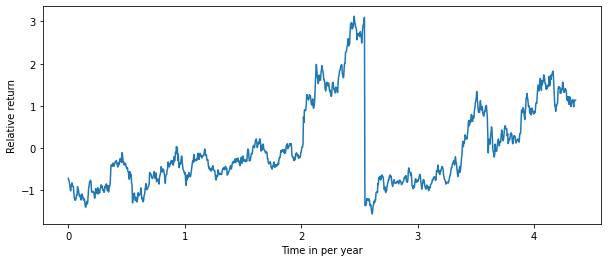

In [ ]:
plt.figure(figsize = (10,4))
plt.plot(ts_, y_train)
plt.xlabel('Time in per year')
plt.ylabel('Relative return')
plt.show()

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
xs_ = x_train
ys_ = y_train
xs_ext_ = x_test
ys_ext_ = y_test
xs = torch.tensor(xs_).float().to(device)
ys = torch.tensor(ys_).float().to(device)
# ys = ys.view(y_train.shape[0],1)
xs_ext = torch.tensor(xs_ext_).float().to(device)
ys_ext = torch.tensor(ys_ext_).float().to(device)

ts = torch.tensor(ts_).float().to(device)
ts = ts.view(ts_.shape[0],1)
ts_ext = torch.tensor(ts_ext_).float().to(device)
ts_ext = ts_ext.view(ts_ext_.shape[0],1)
ts_vis = ts_ext


In [ ]:
Data = namedtuple('Data', ['ts_', 'ts_ext_', 'ts_vis_', 'ts', 'ts_ext', 'ts_vis', 'ys', 'ys_','ys_ext_'])

# **SDE Definition**

In [ ]:
__all__ = ['SDENet']

class Drift(nn.Module):
    def __init__(self):
        super(Drift, self).__init__()
        self.fc = nn.Linear(50, 50)
        self.relu = nn.ReLU(inplace=True)
    def forward(self, t, x):
        out = self.relu(self.fc(x))
        return out    



class Diffusion(nn.Module):
    def __init__(self):
        super(Diffusion, self).__init__()
        self.relu = nn.ReLU(inplace=True)
        self.fc1 = nn.Linear(50, 100)
        self.fc2 = nn.Linear(100, 1)
    def forward(self, t, x):
        out = self.relu(self.fc1(x))
        out = self.fc2(out)
        out = torch.relu(out)
        return out


    
class SDENet(nn.Module):
    def __init__(self, layer_depth):
        super(SDENet, self).__init__()
        self.layer_depth = layer_depth
        self.downsampling_layers = nn.Linear(sequence_length, 50)
        self.drift = Drift()
        self.diffusion = Diffusion()
        self.fc_layers = nn.Sequential(nn.ReLU(inplace=True), nn.Linear(50, 2))
        self.deltat = 1./self.layer_depth
        self.sigma = 0.5
    def forward(self, x, training_diffusion=False):
        out = self.downsampling_layers(x)
        if not training_diffusion:
            t = 0
            diffusion_term = self.sigma*self.diffusion(t, out)
            for i in range(self.layer_depth):
                t = (float(i))/self.layer_depth
                out = out + self.drift(t, out)*self.deltat + diffusion_term*math.sqrt(self.deltat)*torch.randn_like(out).to(x)

            final_out = self.fc_layers(out) 
            mean = final_out[:,0]
            sigma = F.softplus(final_out[:,1])+1e-3
            return mean, sigma
            
        else:
            t = 0
            final_out = self.diffusion(t, out.detach())  
            return final_out

def test():
    model = SDENet(layer_depth=6)
    return model  
 
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

if __name__ == '__main__':
    model = test()
    num_params = count_parameters(model)
    print(num_params)

9003


# **SDE_Regression**

## **DataSet loading**

In [ ]:
X_train = torch.from_numpy(x_train).float()
X_test = torch.from_numpy(x_test).float()
Y_train = torch.from_numpy(y_train).float()
Y_test = torch.from_numpy(y_test).float()
print('X_train.shape:', X_train.shape, '\nX_test.shape:', X_test.shape, '\nY_train.shape:', Y_train.shape, '\nY_test.shape:', Y_test.shape)

X_train.shape: torch.Size([1099, 22]) 
X_test.shape: torch.Size([258, 22]) 
Y_train.shape: torch.Size([1099]) 
Y_test.shape: torch.Size([258])


## **Arguments**

In [ ]:
from __future__ import print_function

parser = argparse.ArgumentParser(description='PyTorch SDENet Training')
parser.add_argument('--epochs', type=int, default=200, help='number of epochs to train')
parser.add_argument('--lr', default=1e-4, type=float, help='learning rate')
parser.add_argument('--lr2', default=0.01, type=float, help='learning rate')
parser.add_argument('--gpu', type=int, default=0)
parser.add_argument('--seed', type=float, default=0)
parser.add_argument('--droprate', type=float, default=0.1, help='learning rate decay')
parser.add_argument('--decreasing_lr', default=[20], nargs='+', help='decreasing strategy')
parser.add_argument('--decreasing_lr2', default=[], nargs='+', help='decreasing strategy')

args = parser.parse_args([])
print(args)
device = torch.device('cuda:' + str(args.gpu) if torch.cuda.is_available() else 'cpu')

batch_size = y_train.squeeze().shape[0]
Iter = 50
Iter_test = 1

Namespace(decreasing_lr=[20], decreasing_lr2=[], droprate=0.1, epochs=200, gpu=0, lr=0.0001, lr2=0.01, seed=0)


## **Model**

In [ ]:
from sklearn.metrics import mean_squared_error
net = SDENet(25)
net = net.to(device)

criterion = nn.MSELoss()

real_label = 0
fake_label = 1

optimizer_F = optim.SGD([ {'params': net.downsampling_layers.parameters()}, {'params': net.drift.parameters()},
{'params': net.fc_layers.parameters()}], lr=args.lr, momentum=0.9, weight_decay=5e-4)

optimizer_G = optim.SGD([ {'params': net.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)

def nll_loss(y, mean, sigma):
    loss = torch.mean(torch.log(sigma**2)+(y-mean)**2/(sigma**2))
    return loss
def mse(y, mean):
    loss = torch.mean((y-mean)**2)
    return loss

# Training
def train(epoch):
    print('\nEpoch: %d' % epoch)
    net.train()
    if epoch == 0:
        net.sigma = 0.1
    if epoch == 30:
        net.sigma = 0.5
    train_loss = 0
    train_loss_in = 0
    train_loss_out = 0
    total = 0
    for iternum in range(Iter):
        inputs, targets = X_train, Y_train
        # print(inputs.shape)
        inputs, targets = inputs.to(device), targets.to(device)
        optimizer_F.zero_grad()
        mean, sigma = net(inputs)
        loss = nll_loss(targets, mean, sigma)
        # loss = criterion(targets, mean)
        loss.backward()
        nn.utils.clip_grad_norm_(net.parameters(), 100.)
        optimizer_F.step()
        train_loss += loss.item()

        label = torch.full((batch_size,1), real_label, device=device)
        optimizer_G.zero_grad()
        predict_in = net(inputs, training_diffusion=True)
        loss_in = criterion(predict_in, label.float())
        loss_in.backward()
        label.fill_(fake_label)

        inputs_out = 2 * torch.randn(batch_size, sequence_length, device = device) + inputs
        predict_out = net(inputs_out, training_diffusion=True)
        loss_out = criterion(predict_out, label.float())
        
        loss_out.backward()
        train_loss_out += loss_out.item()
        train_loss_in += loss_in.item()
        optimizer_G.step()
    plt.figure(figsize = (8, 4))
    plt.plot(ts_, scaler.inverse_transform(mean.cpu().detach().numpy()))
    plt.plot(ts_, scaler.inverse_transform(targets.cpu().detach().numpy()))
    plt.ylim(750,1700)
    img_path = os.path.join('/content/output/', f'train_{epoch}.png')
    plt.savefig(img_path, dpi = 300)
    plt.show()
    print('Train epoch:{} \tLoss: {:.6f}| Loss_in: {:.6f}| Loss_out: {:.6f}'.format(epoch, train_loss/Iter, train_loss_in/Iter, train_loss_out/Iter))
    return mean_squared_error(Y_train.numpy(), mean.cpu().detach().numpy())

# Testing
def test(epoch):
    net.eval()
    test_loss = 0
    total = 0
    with torch.no_grad():
        for iternum in range(Iter_test):
            inputs, targets = X_test, Y_test
            inputs, targets = inputs.to(device), targets.to(device)
            current_mean = 0
            for i in range(10):
                mean, sigma = net(inputs)
                current_mean = current_mean + mean
            current_mean = current_mean/10
            loss = mse(targets, current_mean)
            plt.figure(figsize = (8, 4))
            plt.plot(ts_ext_, scaler.inverse_transform(current_mean.cpu().detach().numpy()))
            plt.plot(ts_ext_, scaler.inverse_transform(targets.cpu().detach().numpy()))
            plt.ylim(800,2300)
            img_path = os.path.join('/content/output/', f'test_{epoch}.png')
            plt.savefig(img_path, dpi = 300)
            plt.show()
            test_loss += loss.item()
    
    print('Test epoch:{} \tLoss: {:.6f}'.format(epoch, np.sqrt(test_loss/Iter_test)))
    return mean_squared_error(Y_test.numpy(), current_mean.cpu().detach().numpy())


## **Run Epochs**


Epoch: 1


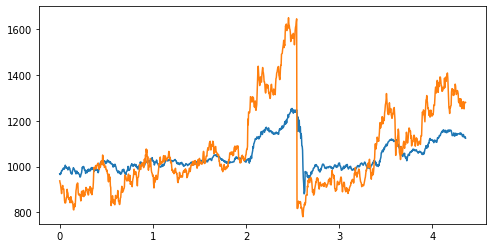

Train epoch:1 	Loss: 0.828161| Loss_in: 0.037946| Loss_out: 0.112570


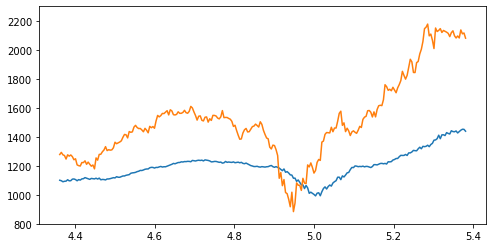

Test epoch:1 	Loss: 2.026616

Epoch: 2


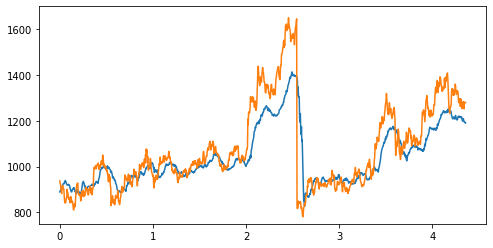

Train epoch:2 	Loss: -0.113233| Loss_in: 0.007393| Loss_out: 0.046306


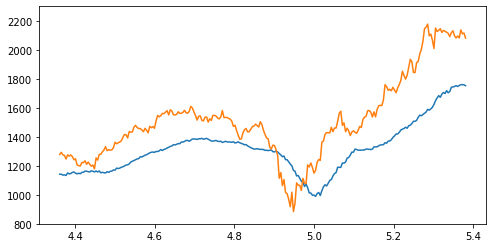

Test epoch:2 	Loss: 1.338092

Epoch: 3


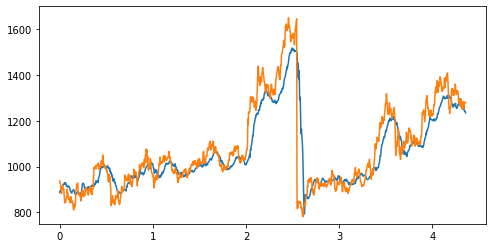

Train epoch:3 	Loss: -0.642112| Loss_in: 0.006259| Loss_out: 0.040791


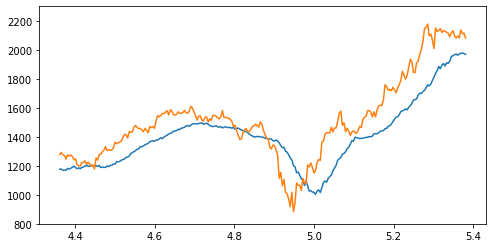

Test epoch:3 	Loss: 0.908975

Epoch: 4


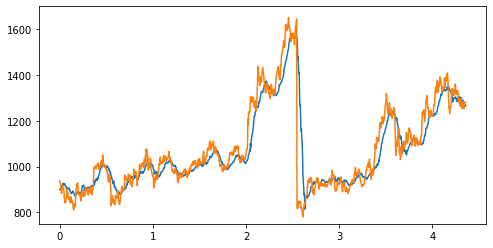

Train epoch:4 	Loss: -1.060835| Loss_in: 0.005691| Loss_out: 0.038218


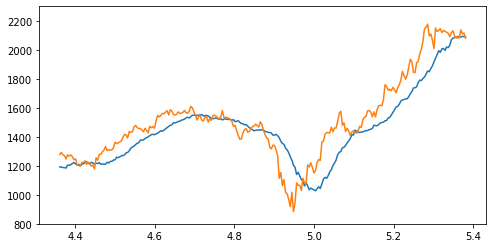

Test epoch:4 	Loss: 0.711449

Epoch: 5


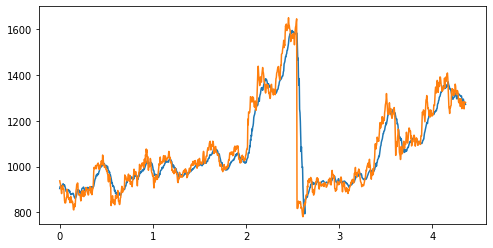

Train epoch:5 	Loss: -1.346736| Loss_in: 0.005218| Loss_out: 0.036407


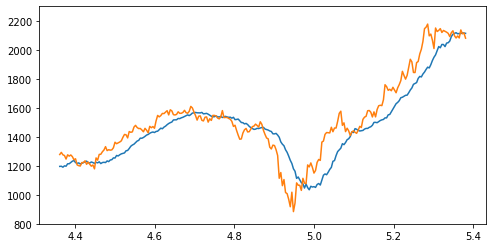

Test epoch:5 	Loss: 0.640621

Epoch: 6


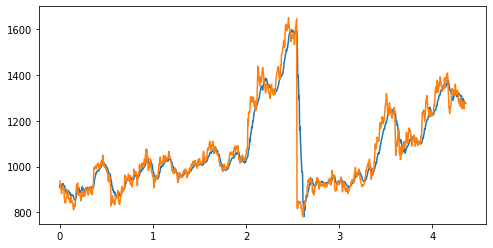

Train epoch:6 	Loss: -1.589795| Loss_in: 0.004907| Loss_out: 0.035394


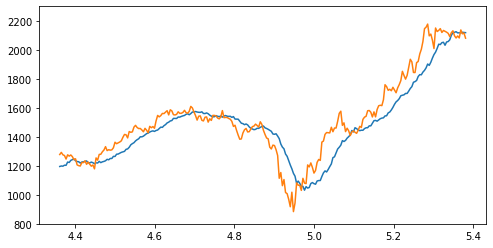

Test epoch:6 	Loss: 0.585139

Epoch: 7


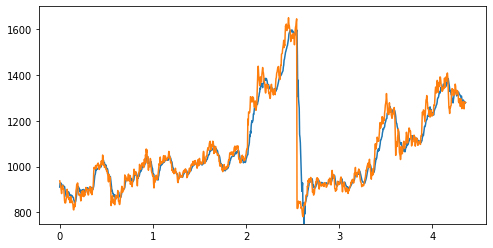

Train epoch:7 	Loss: -1.802736| Loss_in: 0.004709| Loss_out: 0.033872


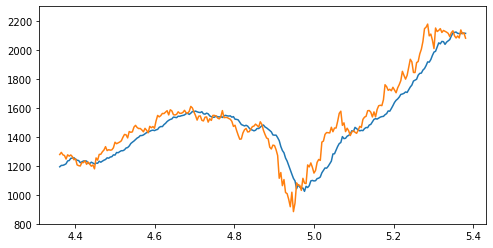

Test epoch:7 	Loss: 0.533380

Epoch: 8


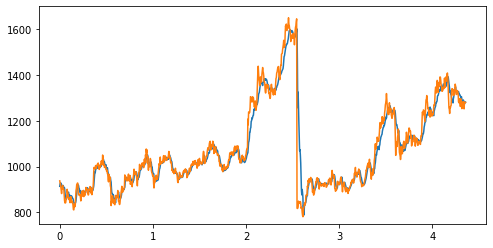

Train epoch:8 	Loss: -1.982175| Loss_in: 0.004466| Loss_out: 0.032758


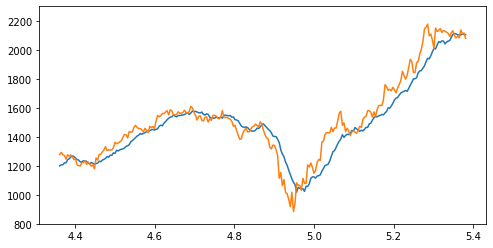

Test epoch:8 	Loss: 0.478716

Epoch: 9


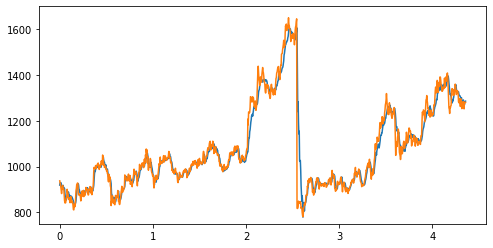

Train epoch:9 	Loss: -2.121747| Loss_in: 0.004289| Loss_out: 0.032664


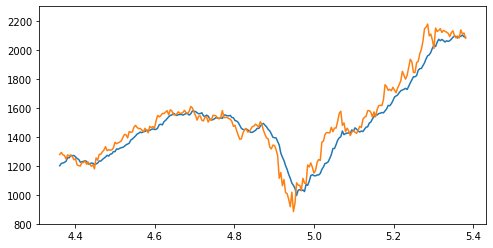

Test epoch:9 	Loss: 0.428976

Epoch: 10


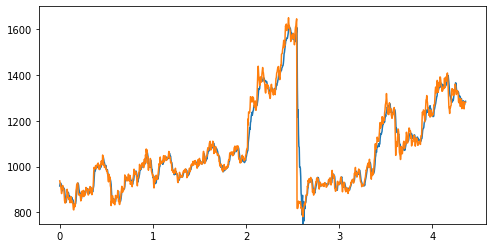

Train epoch:10 	Loss: -2.238912| Loss_in: 0.004149| Loss_out: 0.031431


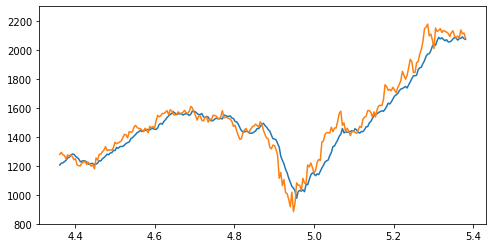

Test epoch:10 	Loss: 0.393922

Epoch: 11


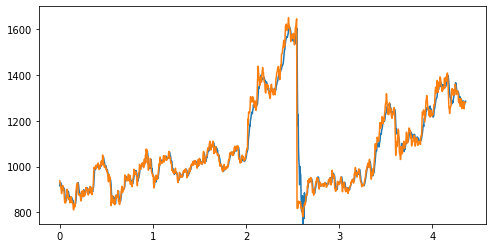

Train epoch:11 	Loss: -2.336557| Loss_in: 0.003923| Loss_out: 0.030825


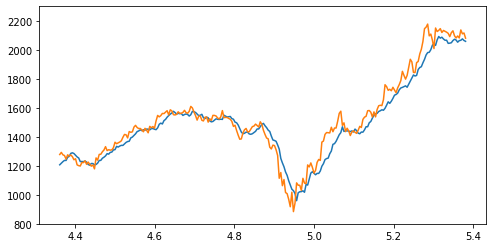

Test epoch:11 	Loss: 0.371944

Epoch: 12


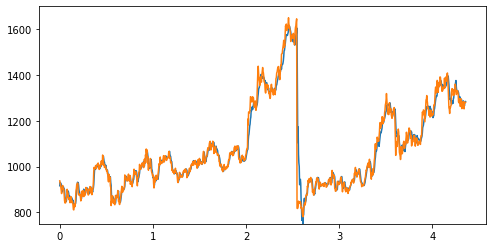

Train epoch:12 	Loss: -2.428836| Loss_in: 0.003786| Loss_out: 0.030267


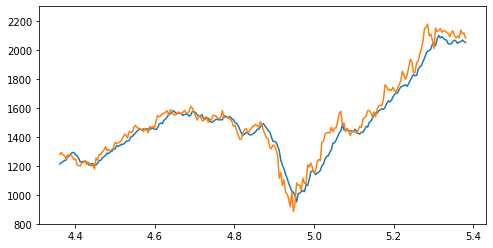

Test epoch:12 	Loss: 0.353838

Epoch: 13


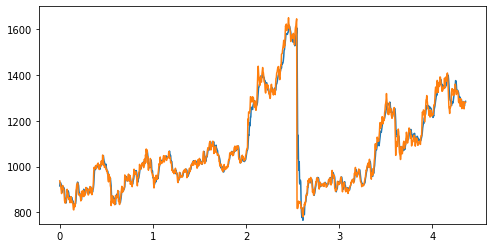

Train epoch:13 	Loss: -2.513001| Loss_in: 0.003665| Loss_out: 0.030094


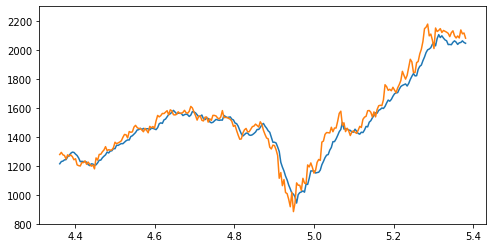

Test epoch:13 	Loss: 0.338197

Epoch: 14


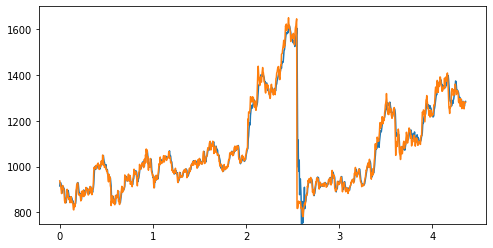

Train epoch:14 	Loss: -2.584359| Loss_in: 0.003605| Loss_out: 0.029354


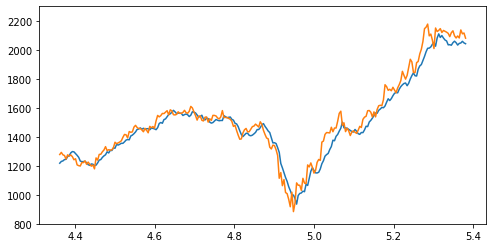

Test epoch:14 	Loss: 0.328831

Epoch: 15


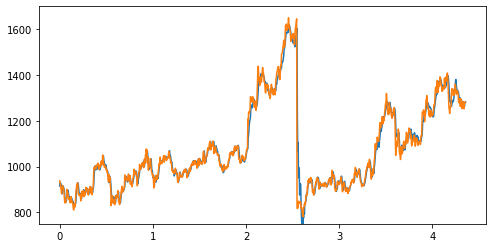

Train epoch:15 	Loss: -2.661966| Loss_in: 0.003536| Loss_out: 0.029129


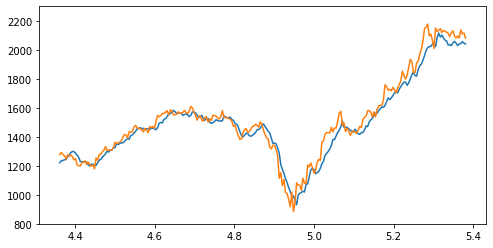

Test epoch:15 	Loss: 0.318737

Epoch: 16


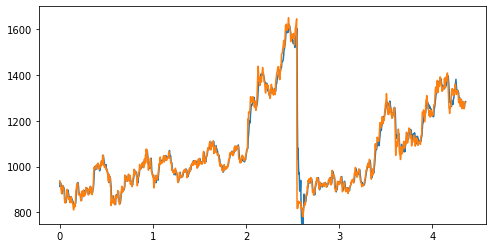

Train epoch:16 	Loss: -2.737644| Loss_in: 0.003415| Loss_out: 0.028614


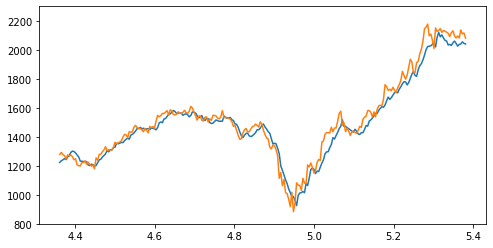

Test epoch:16 	Loss: 0.311418

Epoch: 17


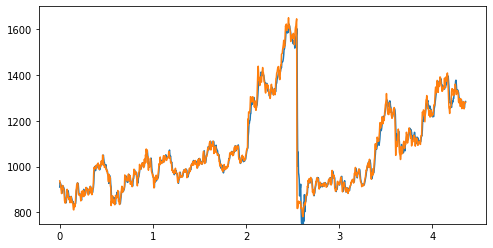

Train epoch:17 	Loss: -2.813563| Loss_in: 0.003384| Loss_out: 0.028294


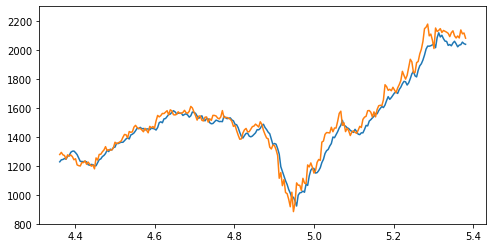

Test epoch:17 	Loss: 0.306928

Epoch: 18


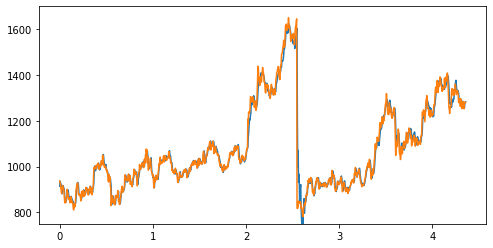

Train epoch:18 	Loss: -2.892668| Loss_in: 0.003239| Loss_out: 0.027298


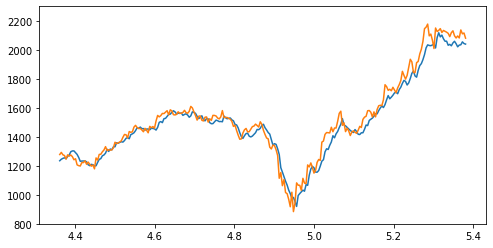

Test epoch:18 	Loss: 0.299229

Epoch: 19


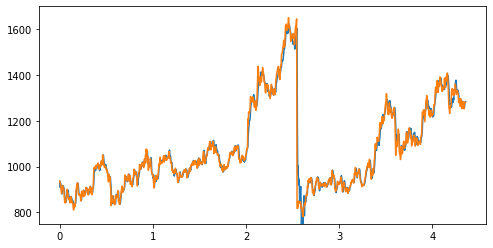

Train epoch:19 	Loss: -2.958256| Loss_in: 0.003160| Loss_out: 0.026930


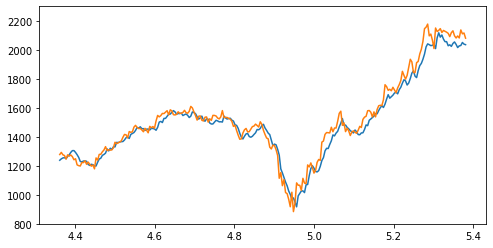

Test epoch:19 	Loss: 0.295128

Epoch: 20


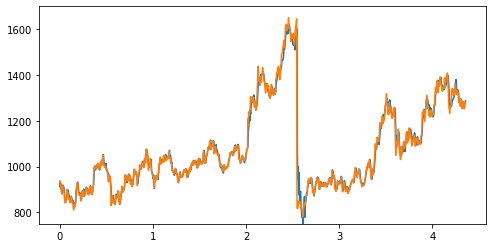

Train epoch:20 	Loss: -3.034393| Loss_in: 0.003166| Loss_out: 0.026845


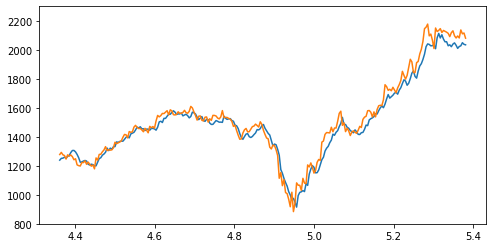

Test epoch:20 	Loss: 0.294277

Epoch: 21


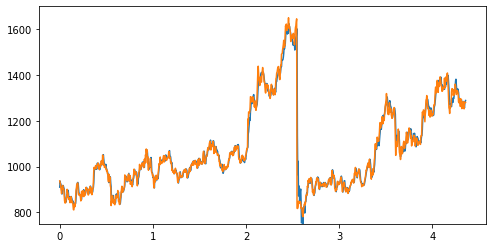

Train epoch:21 	Loss: -3.075877| Loss_in: 0.003123| Loss_out: 0.026440


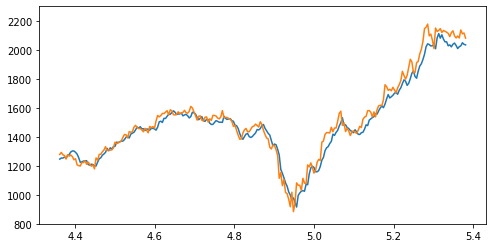

Test epoch:21 	Loss: 0.294562

Epoch: 22


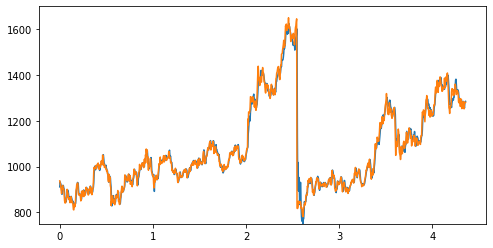

Train epoch:22 	Loss: -3.086449| Loss_in: 0.003057| Loss_out: 0.025754


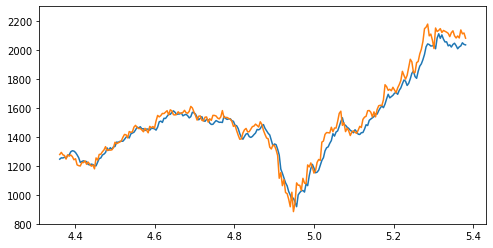

Test epoch:22 	Loss: 0.295494

Epoch: 23


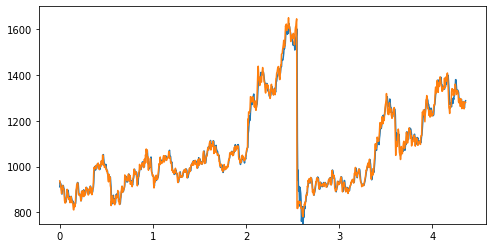

Train epoch:23 	Loss: -3.100367| Loss_in: 0.002982| Loss_out: 0.025246


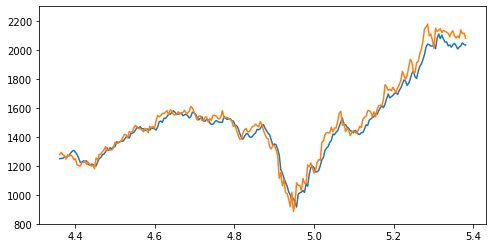

Test epoch:23 	Loss: 0.295171

Epoch: 24


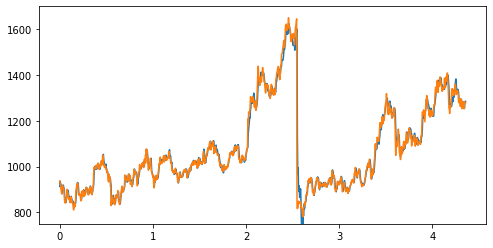

Train epoch:24 	Loss: -3.108432| Loss_in: 0.002909| Loss_out: 0.025058


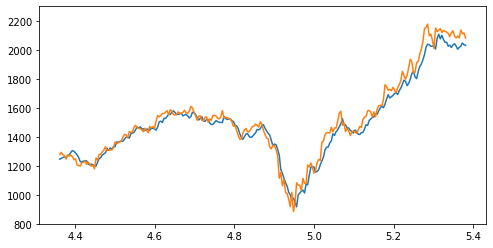

Test epoch:24 	Loss: 0.297052

Epoch: 25


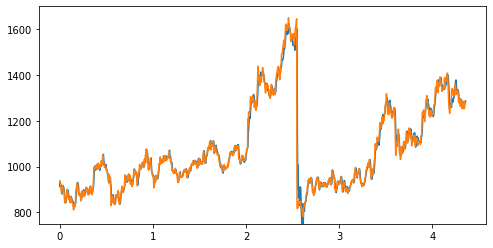

Train epoch:25 	Loss: -3.116417| Loss_in: 0.002890| Loss_out: 0.024801


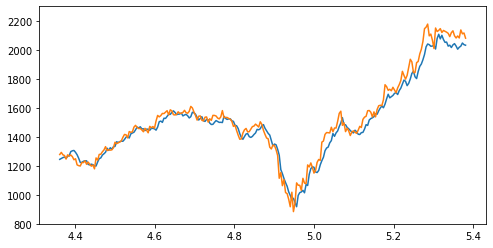

Test epoch:25 	Loss: 0.297484

Epoch: 26


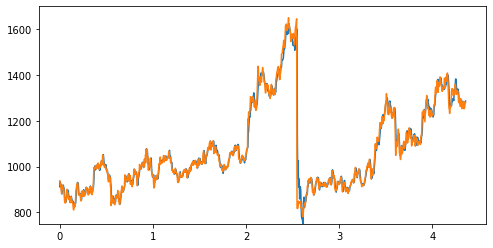

Train epoch:26 	Loss: -3.121208| Loss_in: 0.002889| Loss_out: 0.024859


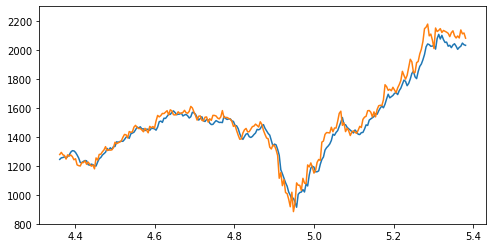

Test epoch:26 	Loss: 0.296704

Epoch: 27


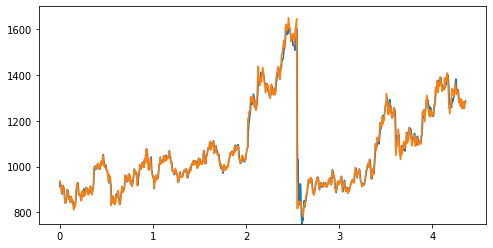

Train epoch:27 	Loss: -3.131556| Loss_in: 0.002874| Loss_out: 0.024300


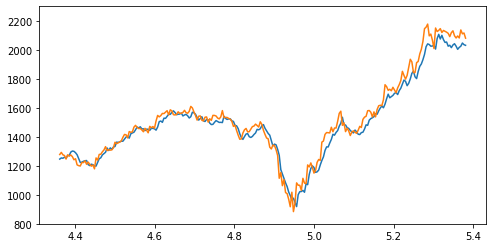

Test epoch:27 	Loss: 0.295000

Epoch: 28


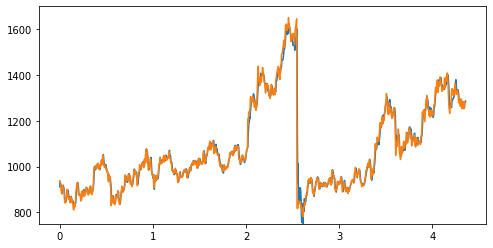

Train epoch:28 	Loss: -3.138856| Loss_in: 0.002755| Loss_out: 0.023974


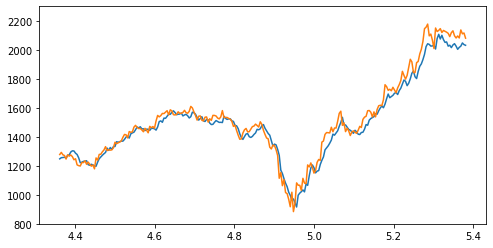

Test epoch:28 	Loss: 0.294860

Epoch: 29


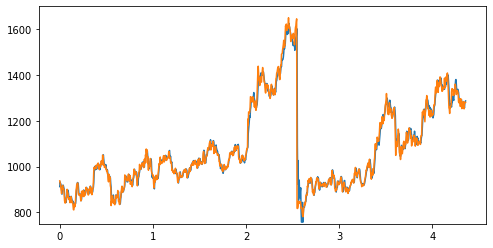

Train epoch:29 	Loss: -3.141463| Loss_in: 0.002779| Loss_out: 0.023589


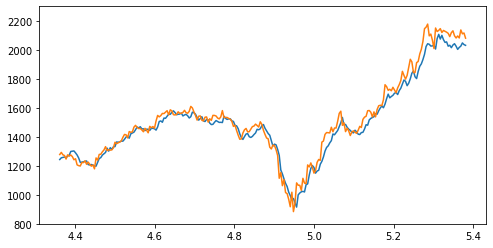

Test epoch:29 	Loss: 0.295040

Epoch: 30


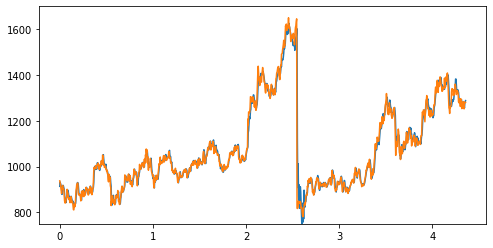

Train epoch:30 	Loss: -3.149914| Loss_in: 0.002746| Loss_out: 0.023614


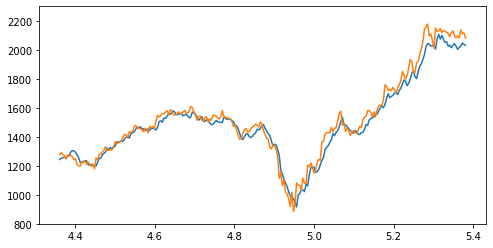

Test epoch:30 	Loss: 0.294272

Epoch: 31


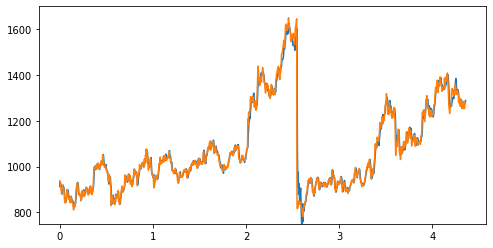

Train epoch:31 	Loss: -3.155847| Loss_in: 0.002718| Loss_out: 0.023751


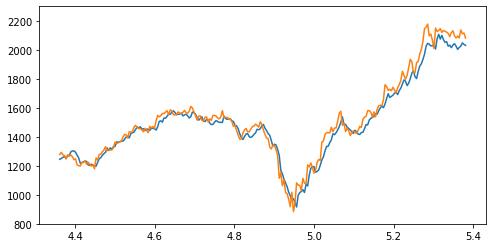

Test epoch:31 	Loss: 0.293287

Epoch: 32


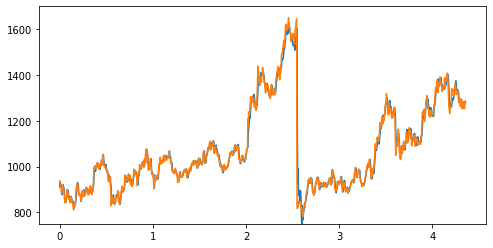

Train epoch:32 	Loss: -3.155690| Loss_in: 0.002690| Loss_out: 0.023307


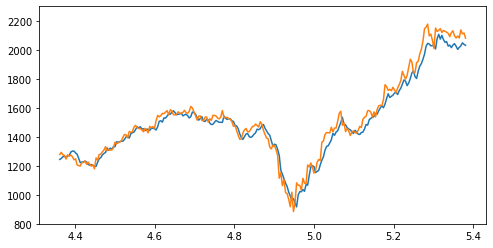

Test epoch:32 	Loss: 0.291528

Epoch: 33


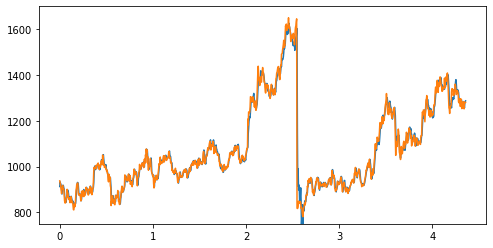

Train epoch:33 	Loss: -3.169659| Loss_in: 0.002621| Loss_out: 0.023140


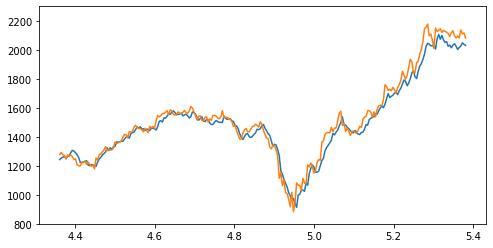

Test epoch:33 	Loss: 0.293676

Epoch: 34


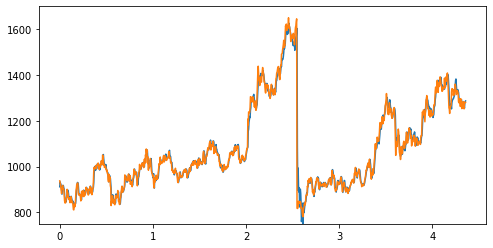

Train epoch:34 	Loss: -3.177250| Loss_in: 0.002612| Loss_out: 0.022785


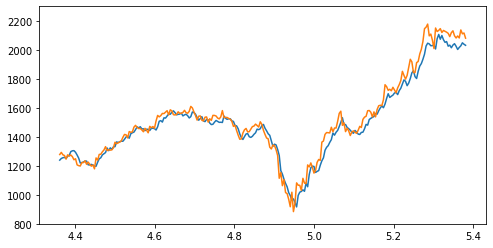

Test epoch:34 	Loss: 0.292765

Epoch: 35


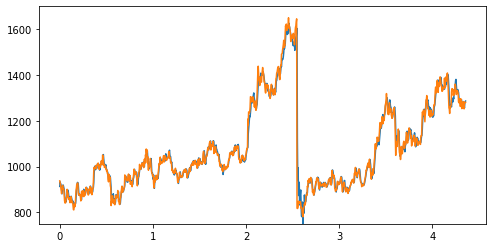

Train epoch:35 	Loss: -3.184496| Loss_in: 0.002554| Loss_out: 0.022690


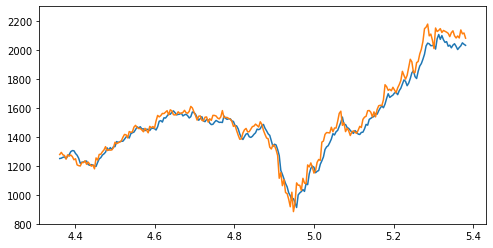

Test epoch:35 	Loss: 0.291000

Epoch: 36


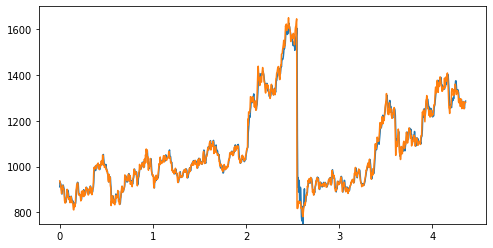

Train epoch:36 	Loss: -3.187795| Loss_in: 0.002524| Loss_out: 0.022426


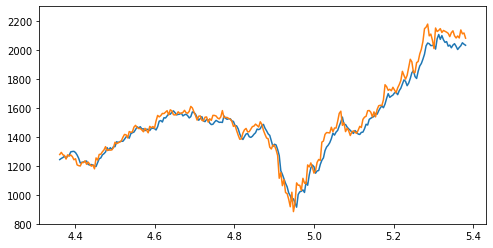

Test epoch:36 	Loss: 0.290811

Epoch: 37


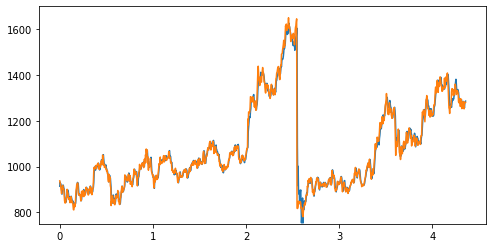

Train epoch:37 	Loss: -3.197215| Loss_in: 0.002483| Loss_out: 0.022397


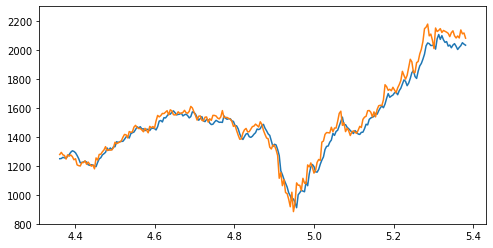

Test epoch:37 	Loss: 0.289956

Epoch: 38


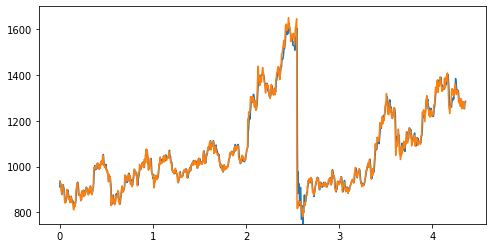

Train epoch:38 	Loss: -3.199828| Loss_in: 0.002457| Loss_out: 0.022289


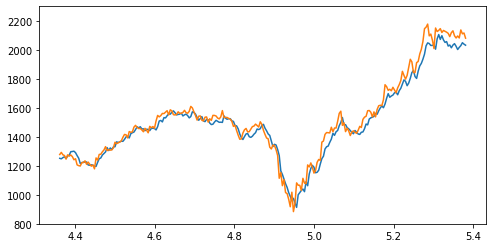

Test epoch:38 	Loss: 0.288420

Epoch: 39


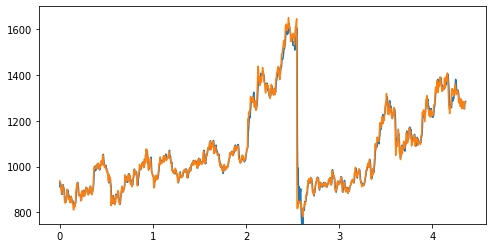

Train epoch:39 	Loss: -3.208198| Loss_in: 0.002450| Loss_out: 0.022170


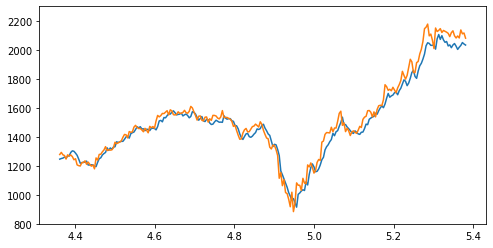

Test epoch:39 	Loss: 0.287547

Epoch: 40


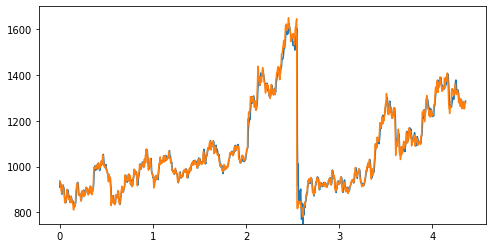

Train epoch:40 	Loss: -3.215849| Loss_in: 0.002359| Loss_out: 0.022259


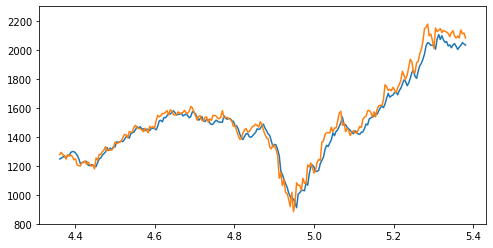

Test epoch:40 	Loss: 0.287851

Epoch: 41


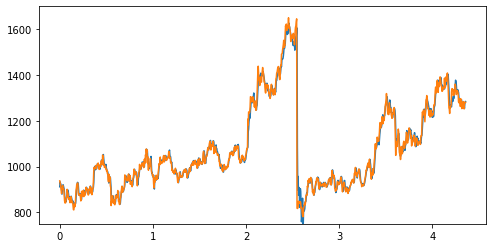

Train epoch:41 	Loss: -3.222199| Loss_in: 0.002344| Loss_out: 0.021732


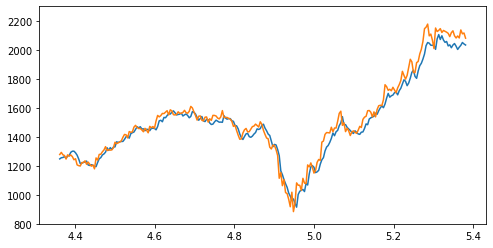

Test epoch:41 	Loss: 0.287201

Epoch: 42


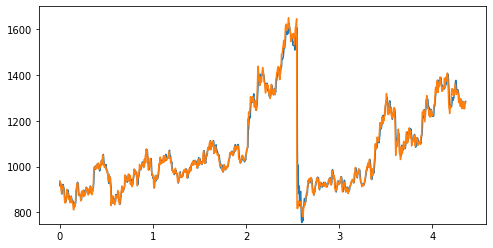

Train epoch:42 	Loss: -3.227440| Loss_in: 0.002393| Loss_out: 0.021836


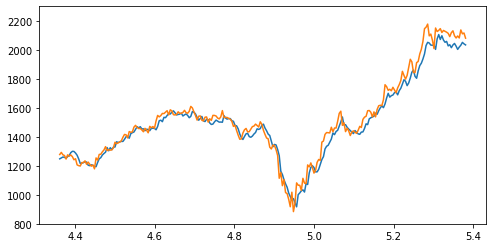

Test epoch:42 	Loss: 0.284412

Epoch: 43


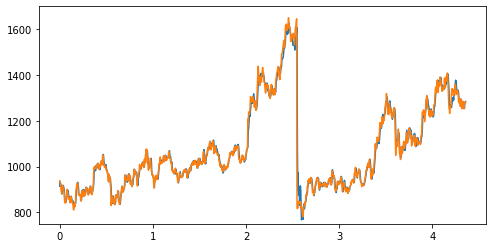

Train epoch:43 	Loss: -3.236225| Loss_in: 0.002393| Loss_out: 0.021836


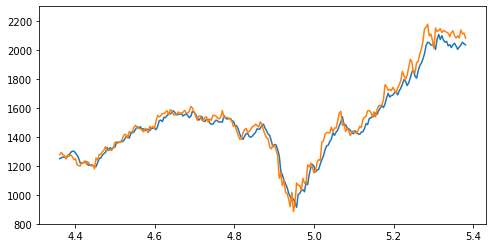

Test epoch:43 	Loss: 0.283947

Epoch: 44


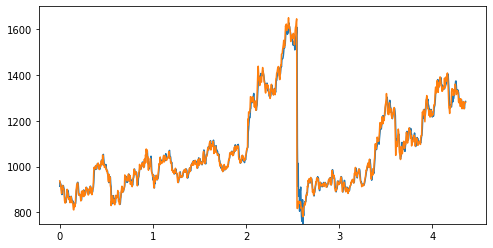

Train epoch:44 	Loss: -3.242755| Loss_in: 0.002262| Loss_out: 0.021309


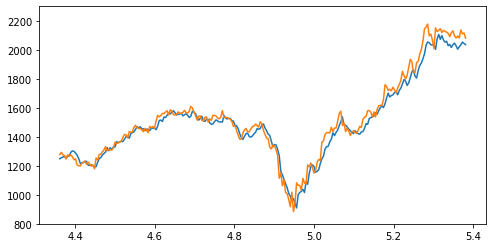

Test epoch:44 	Loss: 0.282105

Epoch: 45


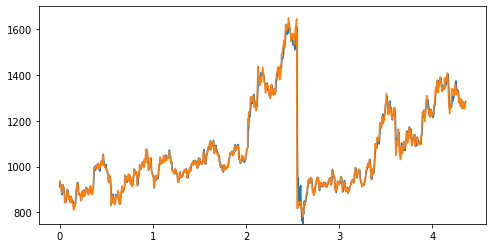

Train epoch:45 	Loss: -3.252129| Loss_in: 0.002271| Loss_out: 0.021356


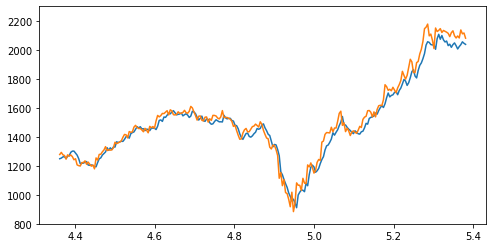

Test epoch:45 	Loss: 0.280563

Epoch: 46


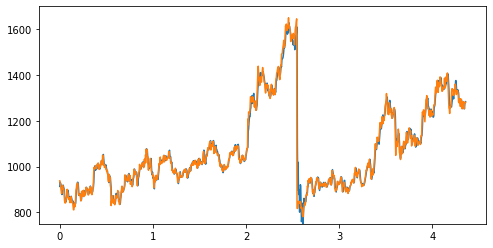

Train epoch:46 	Loss: -3.259989| Loss_in: 0.002263| Loss_out: 0.021232


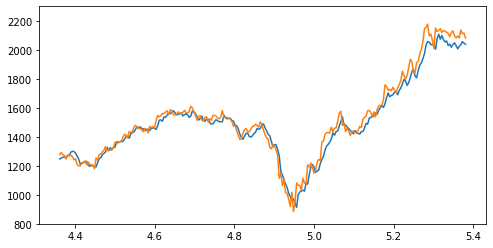

Test epoch:46 	Loss: 0.278801

Epoch: 47


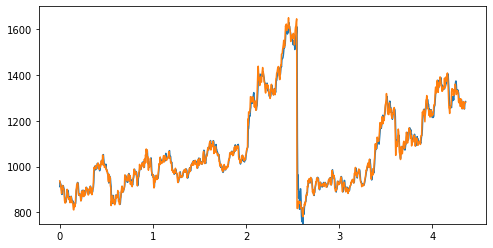

Train epoch:47 	Loss: -3.266633| Loss_in: 0.002244| Loss_out: 0.020757


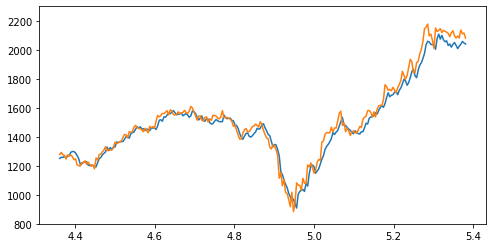

Test epoch:47 	Loss: 0.276602

Epoch: 48


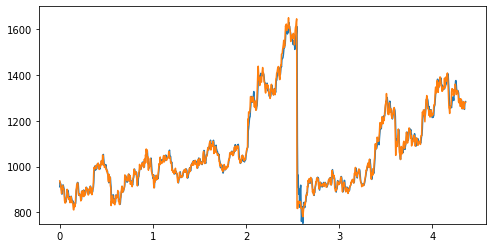

Train epoch:48 	Loss: -3.275120| Loss_in: 0.002183| Loss_out: 0.020625


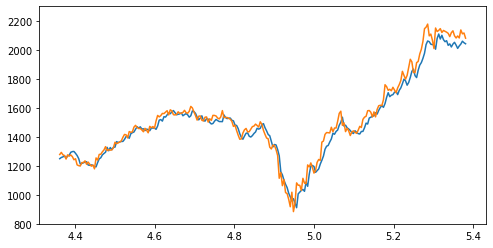

Test epoch:48 	Loss: 0.275429

Epoch: 49


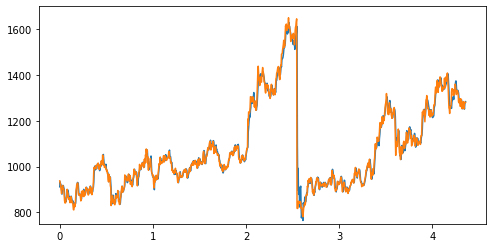

Train epoch:49 	Loss: -3.281786| Loss_in: 0.002209| Loss_out: 0.020795


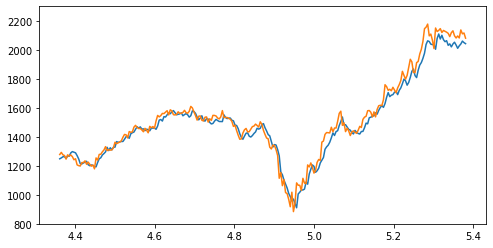

Test epoch:49 	Loss: 0.274387

Epoch: 50


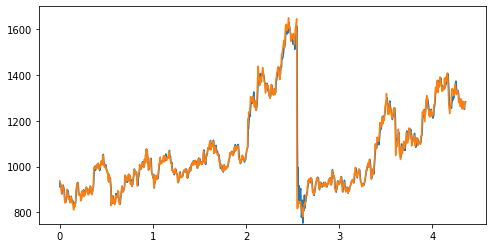

Train epoch:50 	Loss: -3.287806| Loss_in: 0.002180| Loss_out: 0.020478


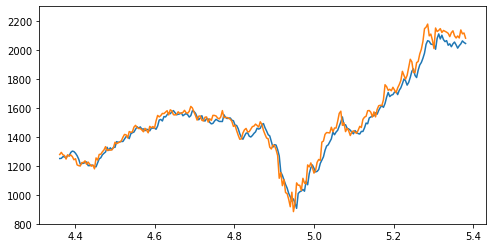

Test epoch:50 	Loss: 0.273699

Epoch: 51


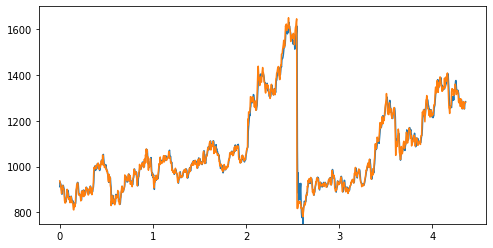

Train epoch:51 	Loss: -3.298335| Loss_in: 0.002177| Loss_out: 0.020232


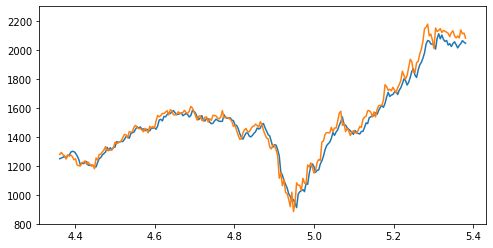

Test epoch:51 	Loss: 0.270602

Epoch: 52


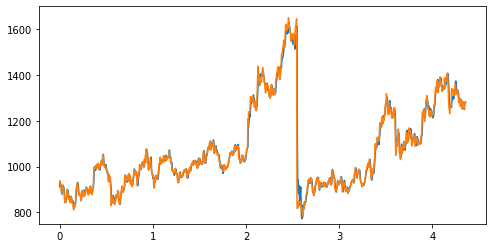

Train epoch:52 	Loss: -3.301186| Loss_in: 0.002165| Loss_out: 0.020248


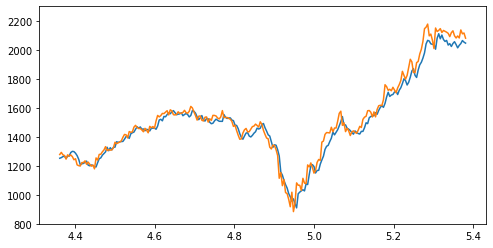

Test epoch:52 	Loss: 0.270535

Epoch: 53


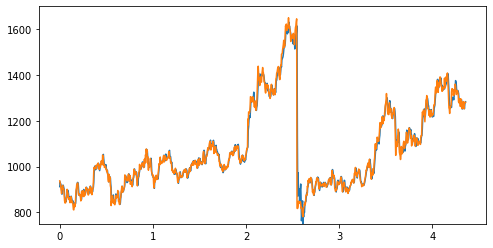

Train epoch:53 	Loss: -3.306095| Loss_in: 0.002186| Loss_out: 0.020115


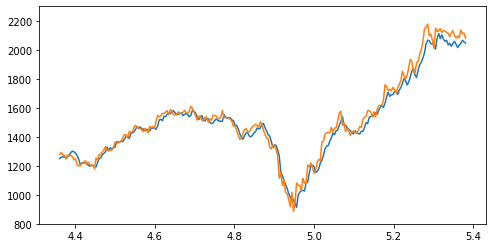

Test epoch:53 	Loss: 0.266629

Epoch: 54


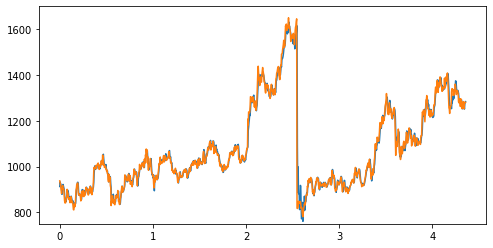

Train epoch:54 	Loss: -3.311851| Loss_in: 0.002096| Loss_out: 0.019834


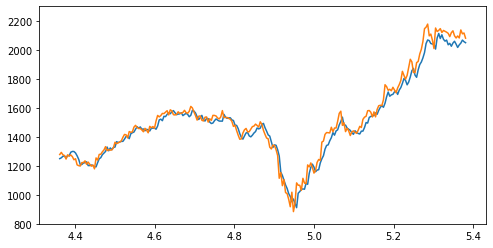

Test epoch:54 	Loss: 0.264331

Epoch: 55


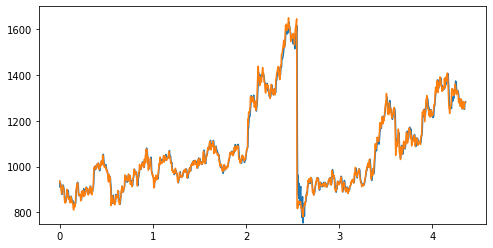

Train epoch:55 	Loss: -3.319501| Loss_in: 0.002135| Loss_out: 0.019806


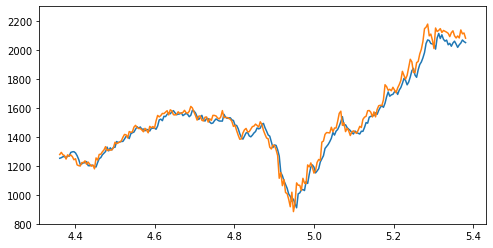

Test epoch:55 	Loss: 0.265006

Epoch: 56


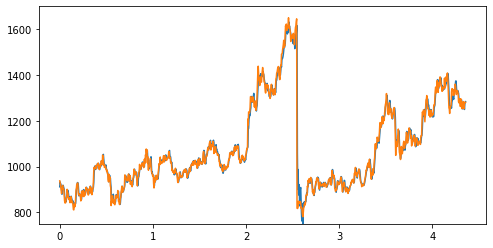

Train epoch:56 	Loss: -3.324863| Loss_in: 0.002081| Loss_out: 0.019487


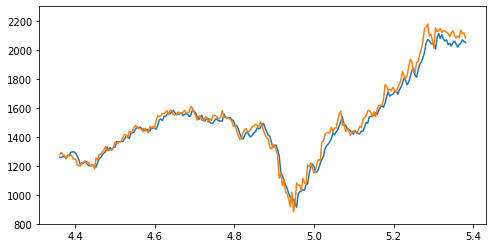

Test epoch:56 	Loss: 0.263460

Epoch: 57


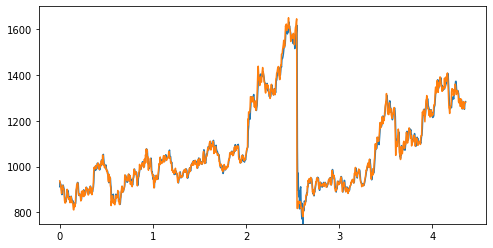

Train epoch:57 	Loss: -3.328525| Loss_in: 0.002087| Loss_out: 0.019392


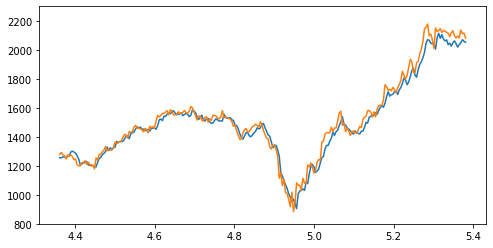

Test epoch:57 	Loss: 0.262745

Epoch: 58


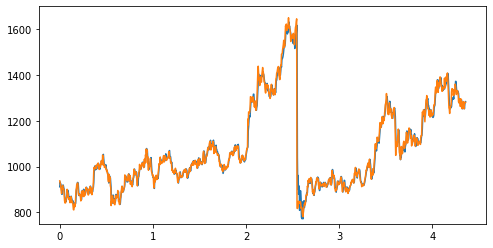

Train epoch:58 	Loss: -3.332438| Loss_in: 0.002091| Loss_out: 0.018939


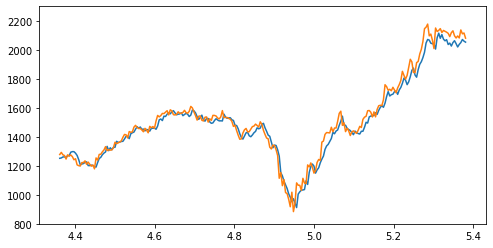

Test epoch:58 	Loss: 0.261811

Epoch: 59


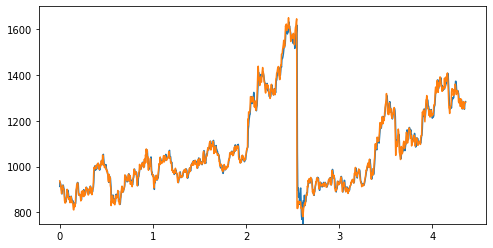

Train epoch:59 	Loss: -3.336732| Loss_in: 0.002067| Loss_out: 0.018946


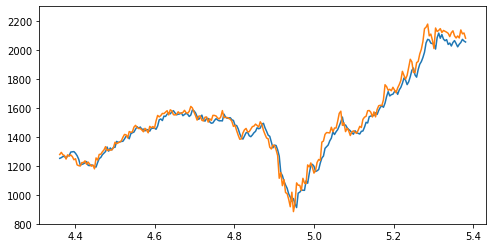

Test epoch:59 	Loss: 0.260729

Epoch: 60


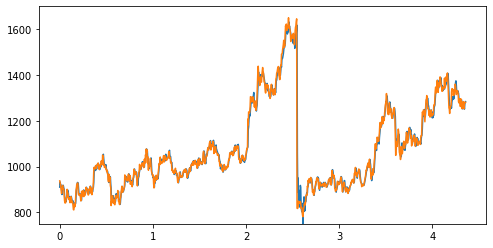

Train epoch:60 	Loss: -3.338537| Loss_in: 0.002052| Loss_out: 0.018869


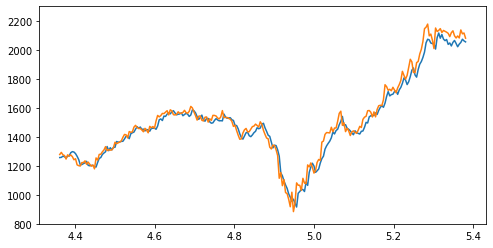

Test epoch:60 	Loss: 0.259389

Epoch: 61


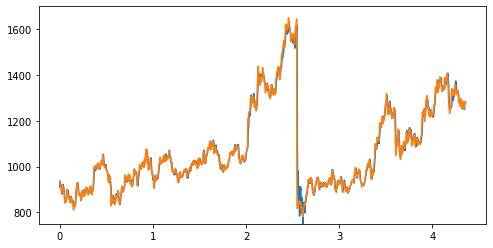

Train epoch:61 	Loss: -3.341958| Loss_in: 0.001977| Loss_out: 0.018559


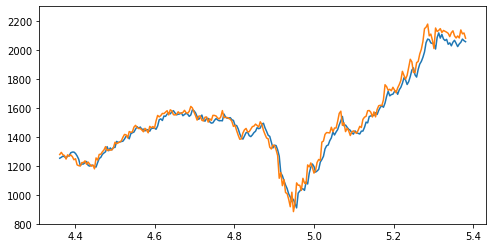

Test epoch:61 	Loss: 0.258655

Epoch: 62


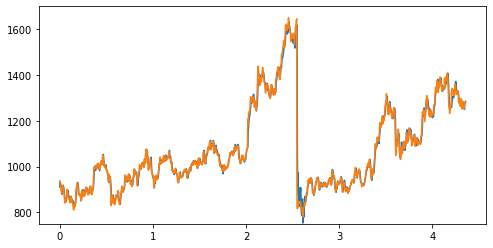

Train epoch:62 	Loss: -3.349755| Loss_in: 0.001953| Loss_out: 0.018356


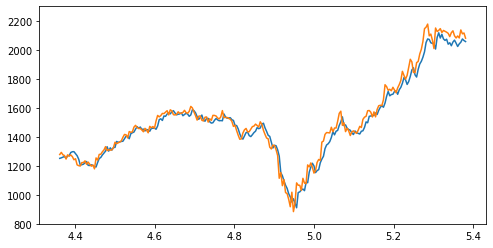

Test epoch:62 	Loss: 0.257389

Epoch: 63


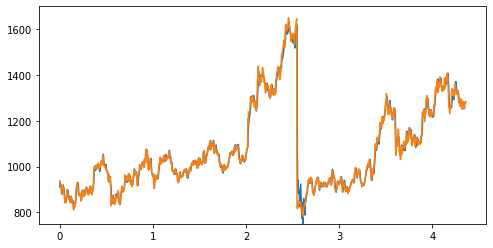

Train epoch:63 	Loss: -3.353594| Loss_in: 0.001956| Loss_out: 0.018563


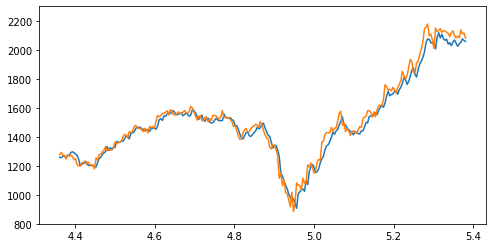

Test epoch:63 	Loss: 0.257461

Epoch: 64


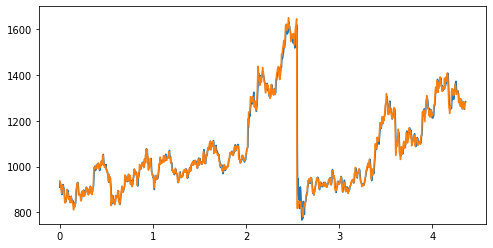

Train epoch:64 	Loss: -3.356985| Loss_in: 0.001929| Loss_out: 0.018164


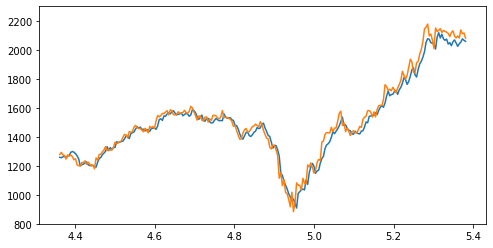

Test epoch:64 	Loss: 0.256178

Epoch: 65


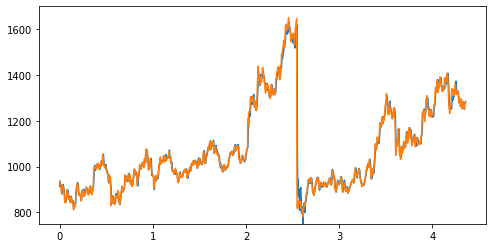

Train epoch:65 	Loss: -3.363679| Loss_in: 0.001882| Loss_out: 0.018077


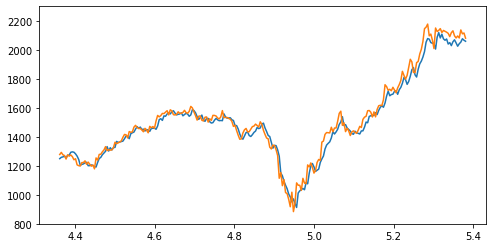

Test epoch:65 	Loss: 0.254546

Epoch: 66


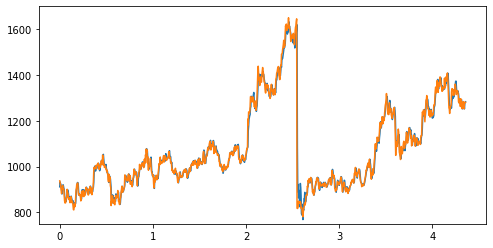

Train epoch:66 	Loss: -3.364218| Loss_in: 0.001913| Loss_out: 0.017817


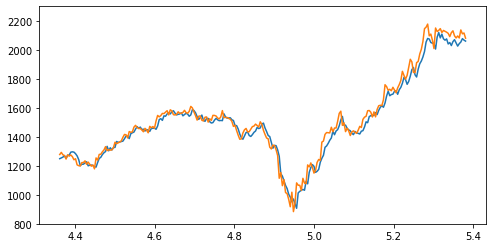

Test epoch:66 	Loss: 0.253898

Epoch: 67


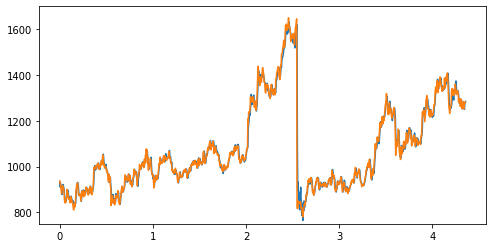

Train epoch:67 	Loss: -3.367995| Loss_in: 0.001911| Loss_out: 0.017816


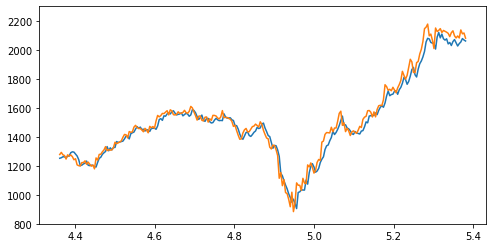

Test epoch:67 	Loss: 0.255445

Epoch: 68


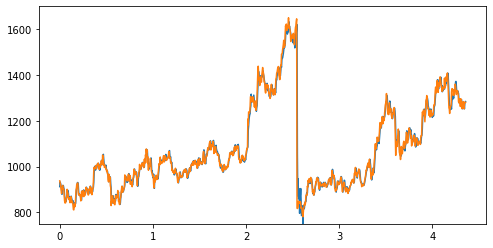

Train epoch:68 	Loss: -3.373052| Loss_in: 0.001821| Loss_out: 0.017489


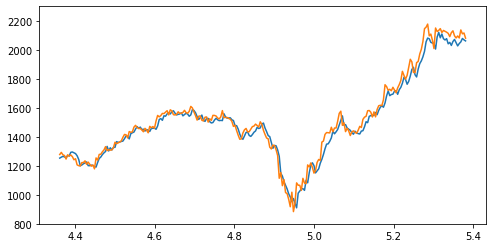

Test epoch:68 	Loss: 0.252155

Epoch: 69


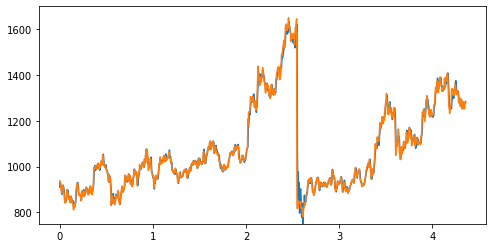

Train epoch:69 	Loss: -3.377473| Loss_in: 0.001830| Loss_out: 0.017244


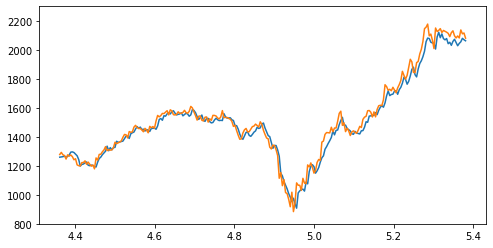

Test epoch:69 	Loss: 0.251315

Epoch: 70


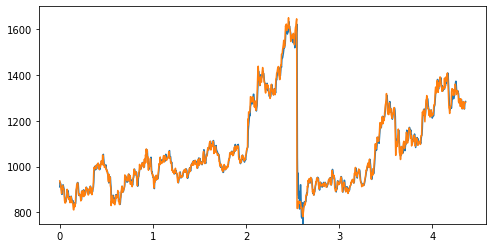

Train epoch:70 	Loss: -3.378256| Loss_in: 0.001852| Loss_out: 0.017324


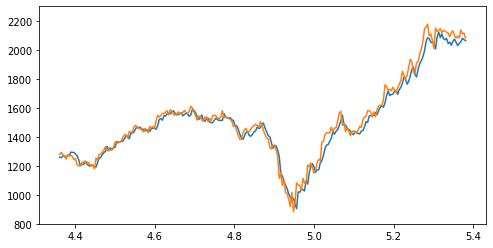

Test epoch:70 	Loss: 0.252896

Epoch: 71


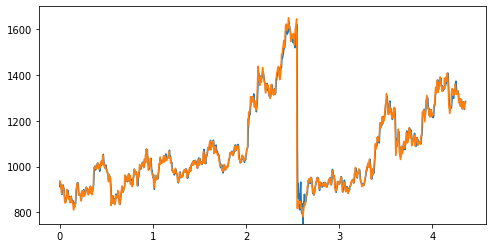

Train epoch:71 	Loss: -3.381547| Loss_in: 0.001816| Loss_out: 0.017141


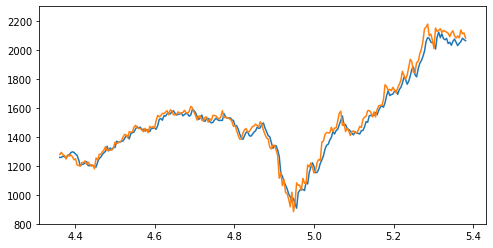

Test epoch:71 	Loss: 0.252002

Epoch: 72


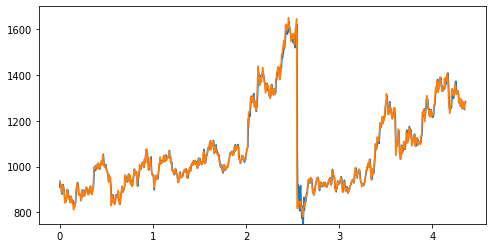

Train epoch:72 	Loss: -3.387327| Loss_in: 0.001789| Loss_out: 0.017041


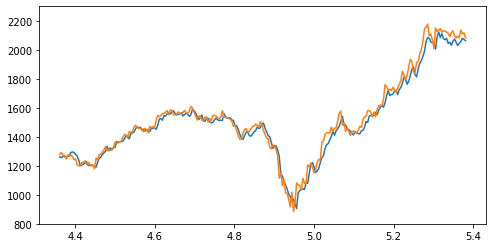

Test epoch:72 	Loss: 0.249522

Epoch: 73


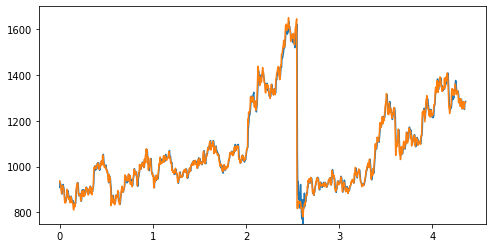

Train epoch:73 	Loss: -3.391121| Loss_in: 0.001807| Loss_out: 0.016858


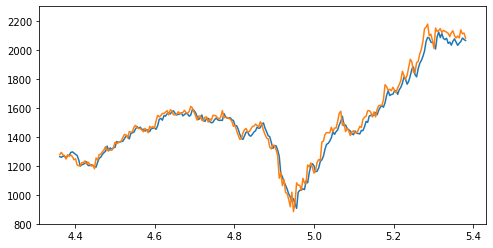

Test epoch:73 	Loss: 0.249397

Epoch: 74


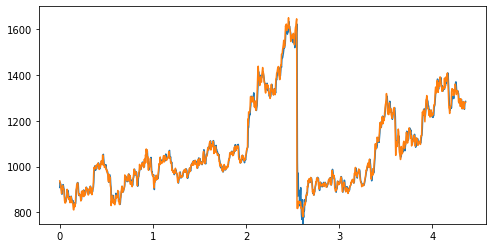

Train epoch:74 	Loss: -3.393837| Loss_in: 0.001791| Loss_out: 0.016779


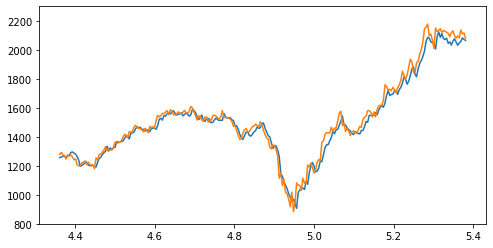

Test epoch:74 	Loss: 0.249156

Epoch: 75


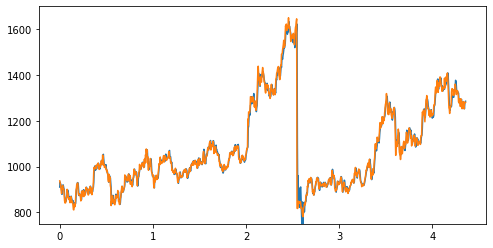

Train epoch:75 	Loss: -3.398249| Loss_in: 0.001812| Loss_out: 0.016725


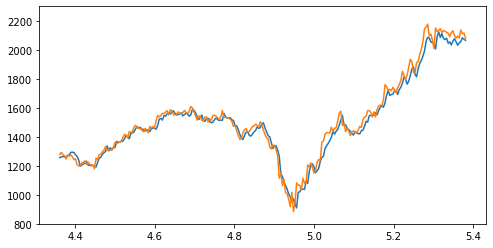

Test epoch:75 	Loss: 0.247407

Epoch: 76


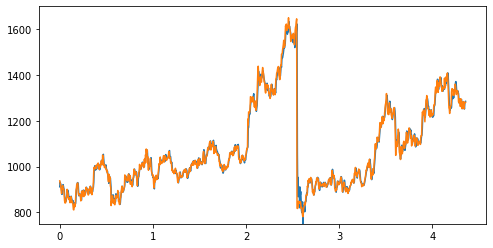

Train epoch:76 	Loss: -3.397780| Loss_in: 0.001769| Loss_out: 0.016468


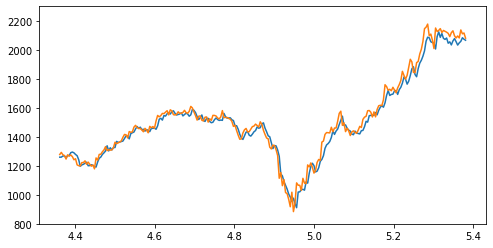

Test epoch:76 	Loss: 0.247298

Epoch: 77


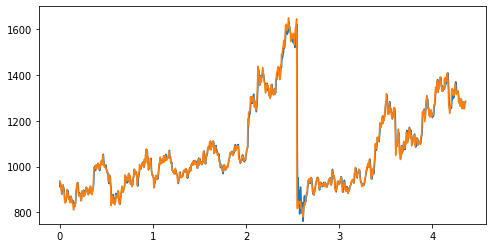

Train epoch:77 	Loss: -3.404856| Loss_in: 0.001767| Loss_out: 0.016394


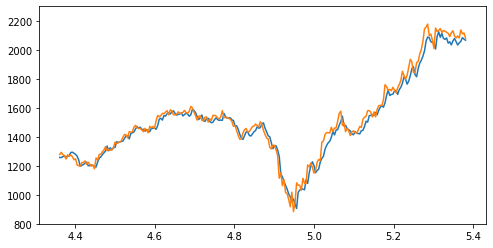

Test epoch:77 	Loss: 0.247600

Epoch: 78


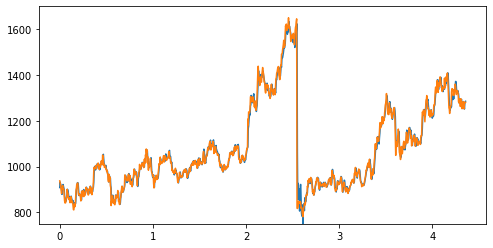

Train epoch:78 	Loss: -3.406446| Loss_in: 0.001745| Loss_out: 0.016180


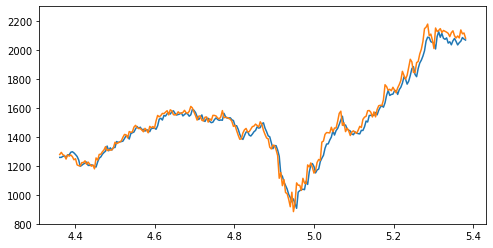

Test epoch:78 	Loss: 0.245118

Epoch: 79


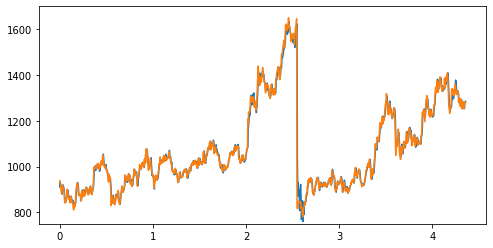

Train epoch:79 	Loss: -3.410640| Loss_in: 0.001745| Loss_out: 0.016000


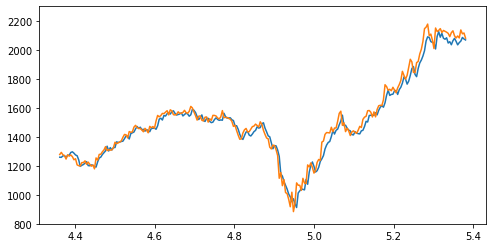

Test epoch:79 	Loss: 0.245698

Epoch: 80


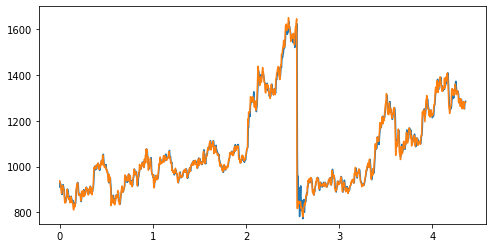

Train epoch:80 	Loss: -3.410254| Loss_in: 0.001699| Loss_out: 0.015939


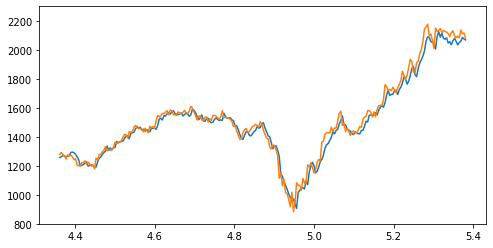

Test epoch:80 	Loss: 0.244927

Epoch: 81


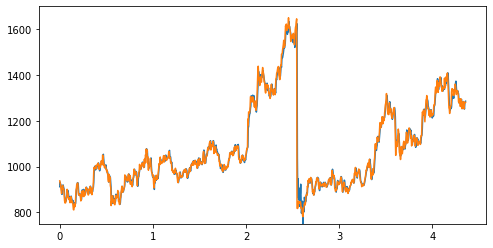

Train epoch:81 	Loss: -3.416434| Loss_in: 0.001688| Loss_out: 0.015885


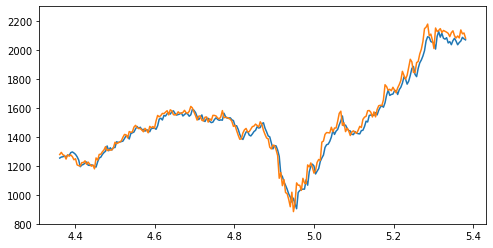

Test epoch:81 	Loss: 0.245608

Epoch: 82


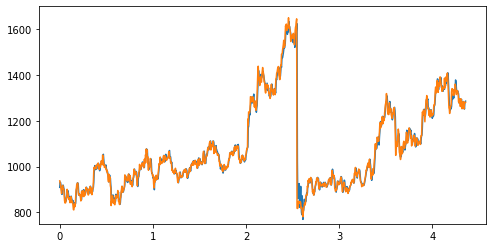

Train epoch:82 	Loss: -3.418084| Loss_in: 0.001699| Loss_out: 0.015901


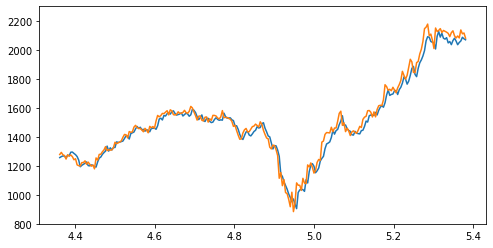

Test epoch:82 	Loss: 0.244586

Epoch: 83


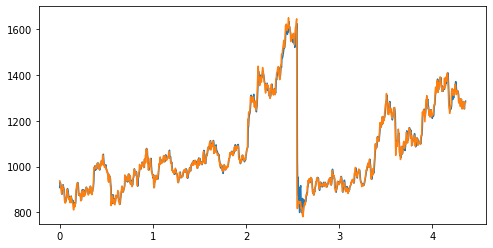

Train epoch:83 	Loss: -3.420946| Loss_in: 0.001706| Loss_out: 0.015691


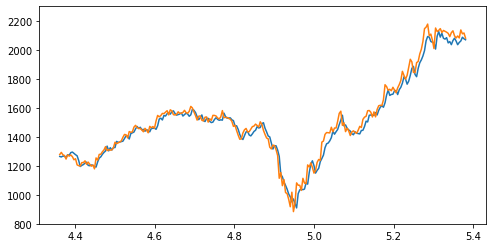

Test epoch:83 	Loss: 0.243947

Epoch: 84


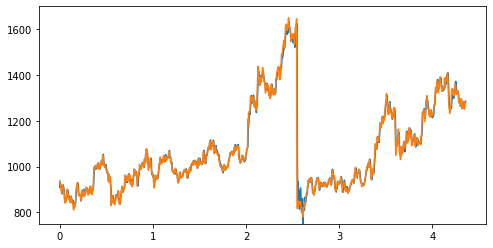

Train epoch:84 	Loss: -3.424661| Loss_in: 0.001691| Loss_out: 0.015225


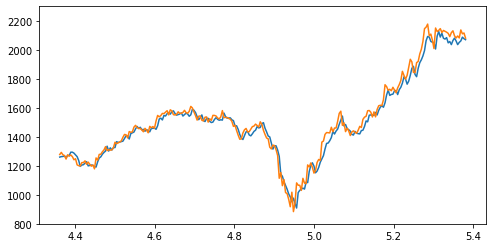

Test epoch:84 	Loss: 0.242458

Epoch: 85


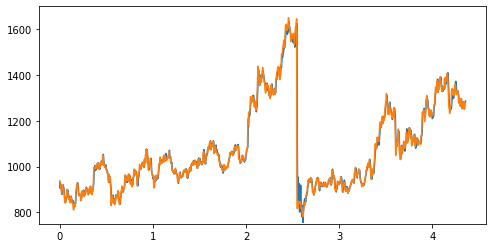

Train epoch:85 	Loss: -3.428443| Loss_in: 0.001600| Loss_out: 0.015409


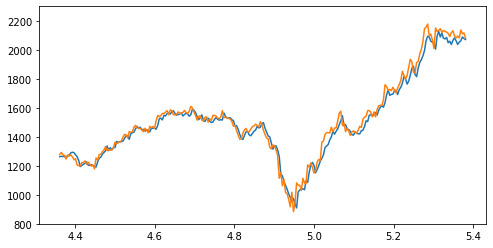

Test epoch:85 	Loss: 0.241338

Epoch: 86


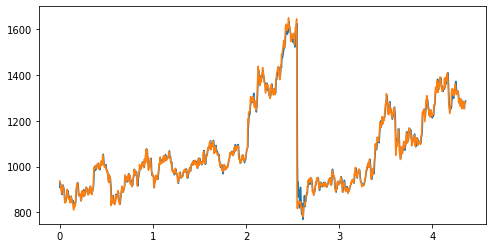

Train epoch:86 	Loss: -3.429474| Loss_in: 0.001626| Loss_out: 0.015408


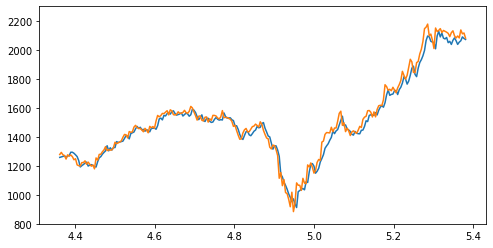

Test epoch:86 	Loss: 0.240660

Epoch: 87


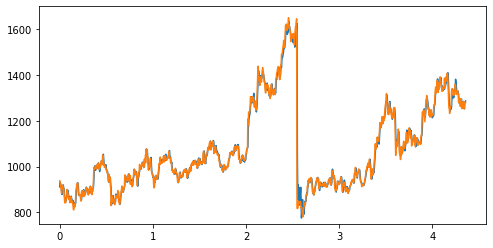

Train epoch:87 	Loss: -3.432797| Loss_in: 0.001651| Loss_out: 0.015131


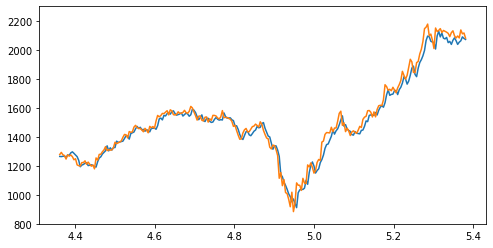

Test epoch:87 	Loss: 0.241975

Epoch: 88


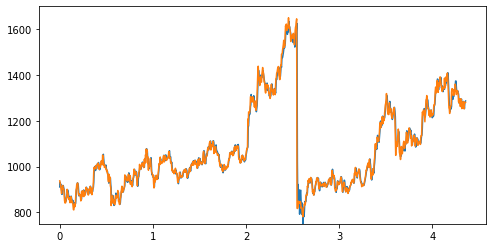

Train epoch:88 	Loss: -3.434726| Loss_in: 0.001603| Loss_out: 0.015037


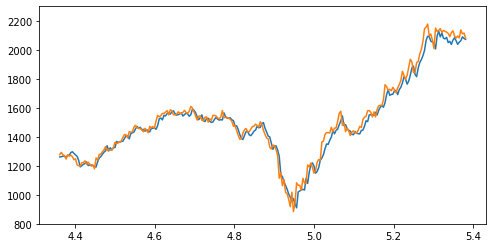

Test epoch:88 	Loss: 0.241227

Epoch: 89


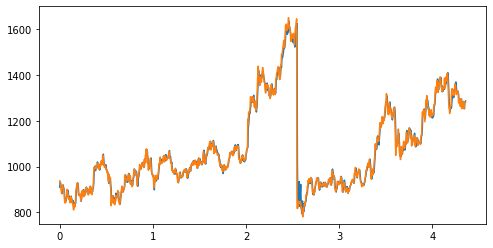

Train epoch:89 	Loss: -3.437707| Loss_in: 0.001607| Loss_out: 0.014961


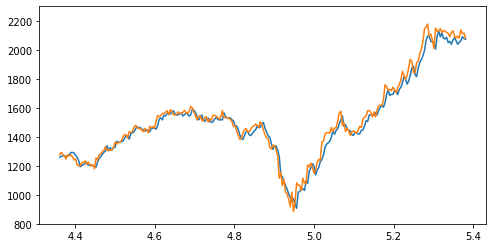

Test epoch:89 	Loss: 0.241047

Epoch: 90


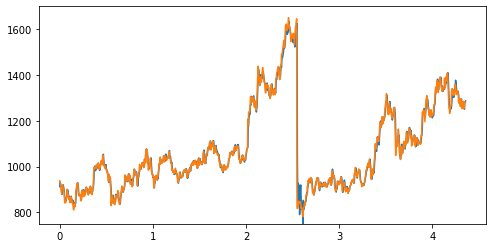

Train epoch:90 	Loss: -3.439009| Loss_in: 0.001622| Loss_out: 0.014859


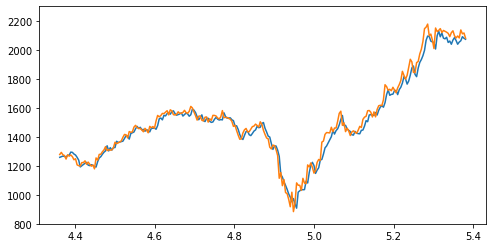

Test epoch:90 	Loss: 0.240063

Epoch: 91


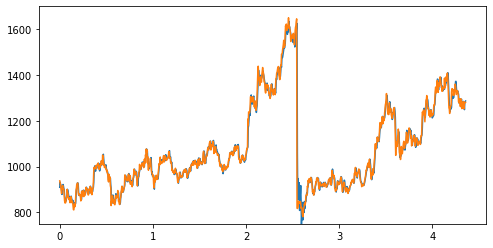

Train epoch:91 	Loss: -3.444177| Loss_in: 0.001587| Loss_out: 0.014643


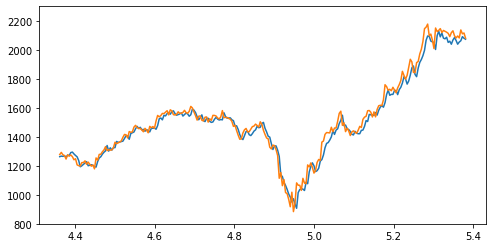

Test epoch:91 	Loss: 0.240111

Epoch: 92


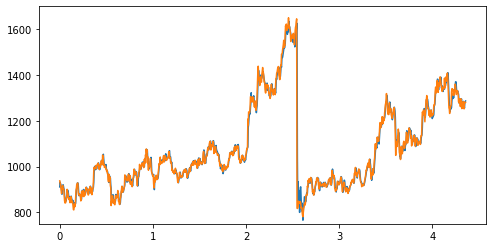

Train epoch:92 	Loss: -3.447267| Loss_in: 0.001620| Loss_out: 0.014542


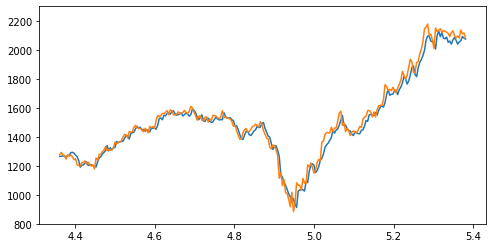

Test epoch:92 	Loss: 0.237556

Epoch: 93


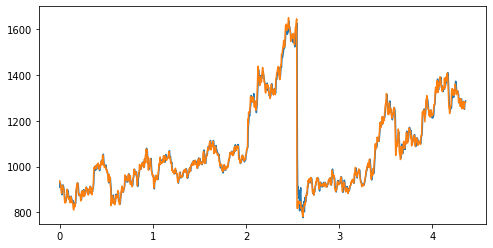

Train epoch:93 	Loss: -3.450727| Loss_in: 0.001585| Loss_out: 0.014598


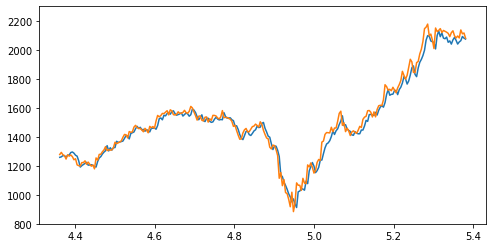

Test epoch:93 	Loss: 0.238539

Epoch: 94


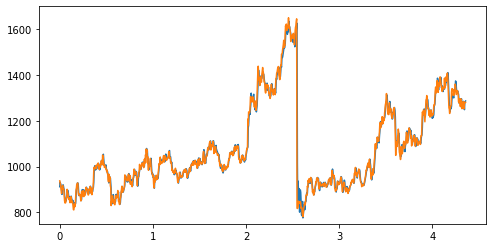

Train epoch:94 	Loss: -3.450805| Loss_in: 0.001614| Loss_out: 0.014416


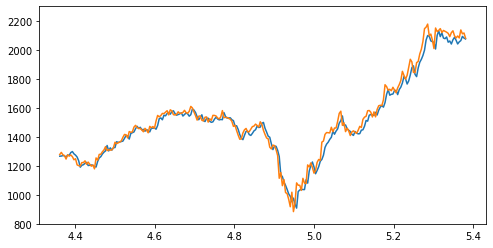

Test epoch:94 	Loss: 0.237278

Epoch: 95


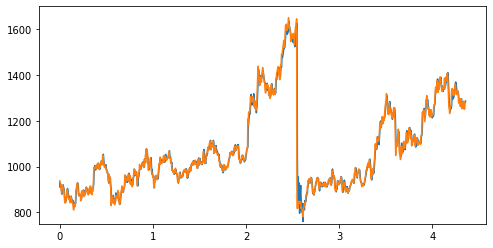

Train epoch:95 	Loss: -3.453491| Loss_in: 0.001612| Loss_out: 0.014217


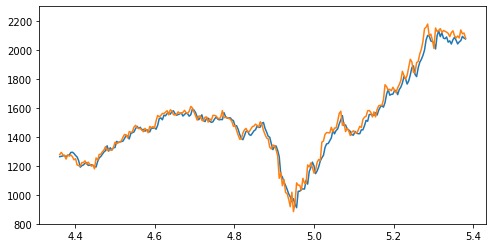

Test epoch:95 	Loss: 0.237185

Epoch: 96


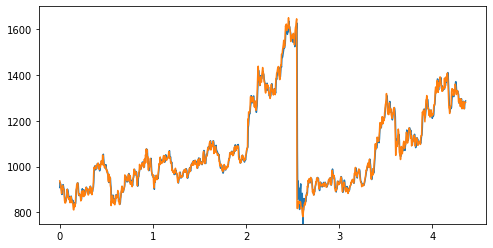

Train epoch:96 	Loss: -3.456020| Loss_in: 0.001561| Loss_out: 0.014207


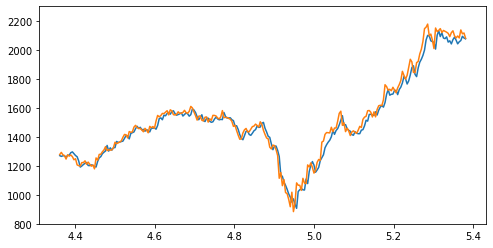

Test epoch:96 	Loss: 0.237044

Epoch: 97


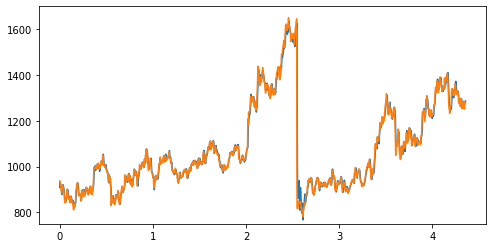

Train epoch:97 	Loss: -3.458220| Loss_in: 0.001632| Loss_out: 0.014151


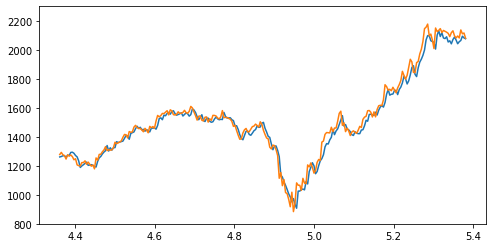

Test epoch:97 	Loss: 0.236587

Epoch: 98


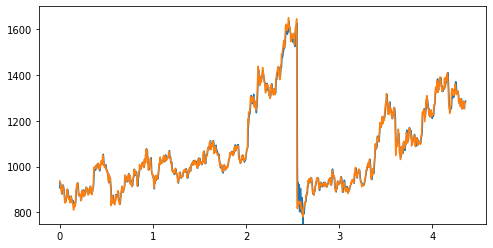

Train epoch:98 	Loss: -3.460267| Loss_in: 0.001605| Loss_out: 0.014087


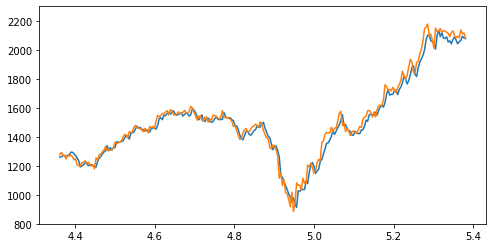

Test epoch:98 	Loss: 0.236773

Epoch: 99


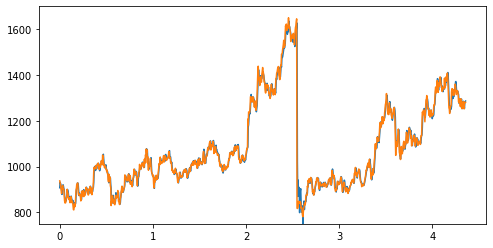

Train epoch:99 	Loss: -3.461601| Loss_in: 0.001594| Loss_out: 0.013947


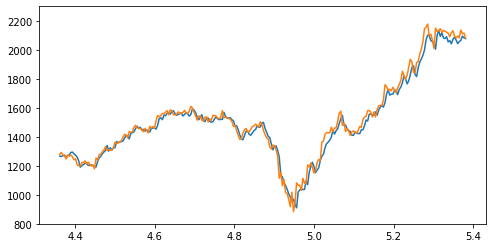

Test epoch:99 	Loss: 0.233700

Epoch: 100


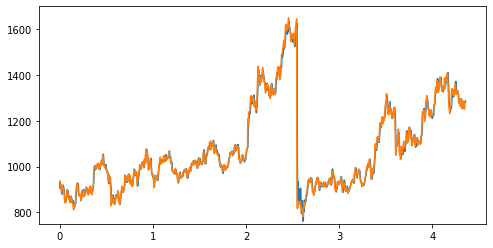

Train epoch:100 	Loss: -3.466751| Loss_in: 0.001583| Loss_out: 0.013894


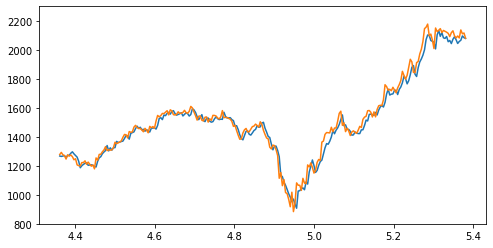

Test epoch:100 	Loss: 0.234464

Epoch: 101


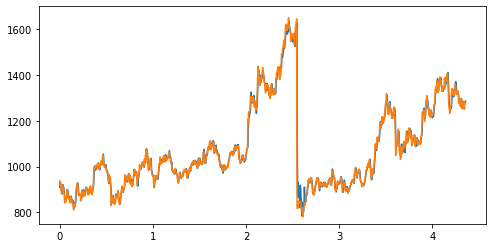

Train epoch:101 	Loss: -3.465277| Loss_in: 0.001606| Loss_out: 0.013695


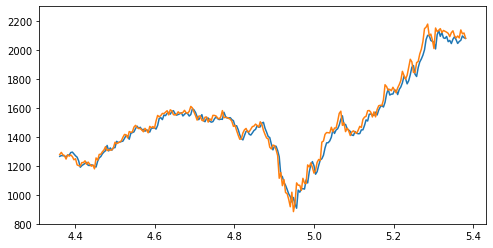

Test epoch:101 	Loss: 0.234283

Epoch: 102


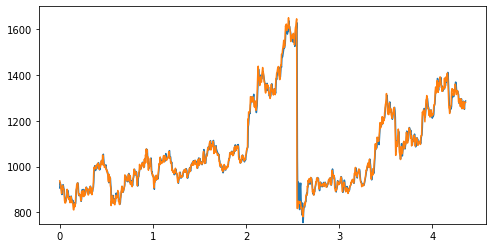

Train epoch:102 	Loss: -3.469465| Loss_in: 0.001556| Loss_out: 0.013709


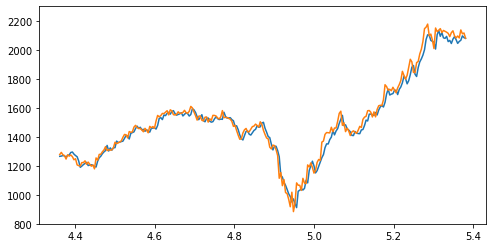

Test epoch:102 	Loss: 0.232400

Epoch: 103


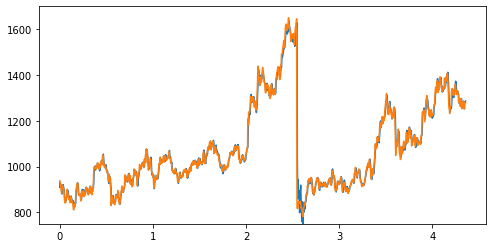

Train epoch:103 	Loss: -3.473430| Loss_in: 0.001571| Loss_out: 0.013442


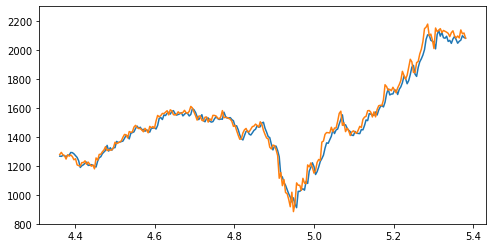

Test epoch:103 	Loss: 0.232386

Epoch: 104


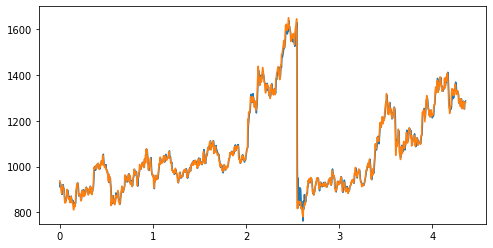

Train epoch:104 	Loss: -3.474211| Loss_in: 0.001542| Loss_out: 0.013403


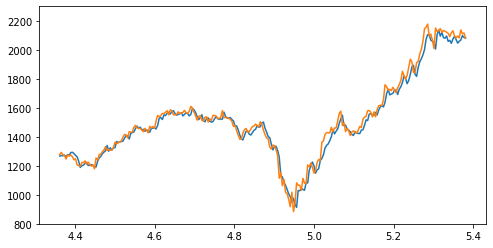

Test epoch:104 	Loss: 0.232067

Epoch: 105


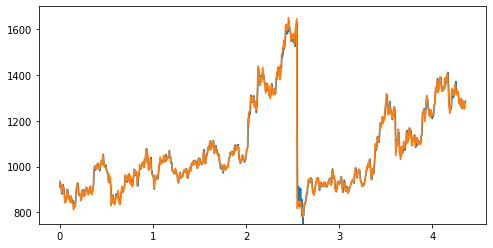

Train epoch:105 	Loss: -3.476733| Loss_in: 0.001529| Loss_out: 0.013261


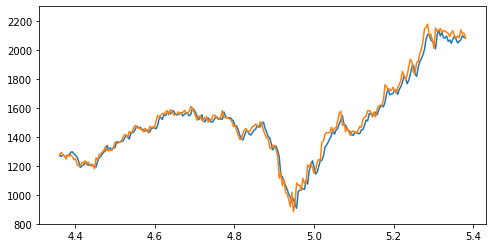

Test epoch:105 	Loss: 0.232243

Epoch: 106


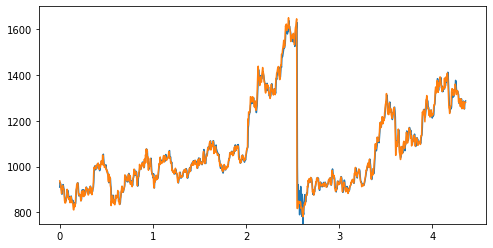

Train epoch:106 	Loss: -3.479723| Loss_in: 0.001568| Loss_out: 0.013046


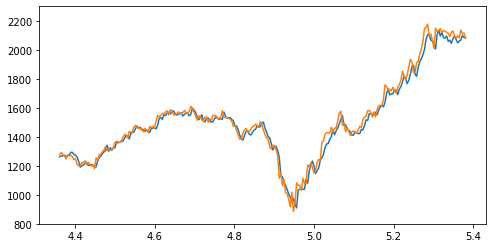

Test epoch:106 	Loss: 0.230673

Epoch: 107


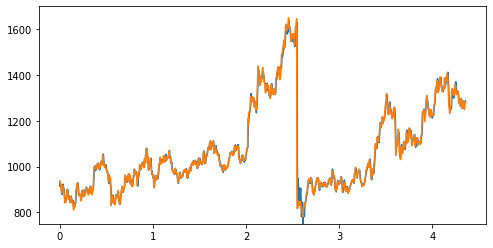

Train epoch:107 	Loss: -3.482929| Loss_in: 0.001594| Loss_out: 0.013221


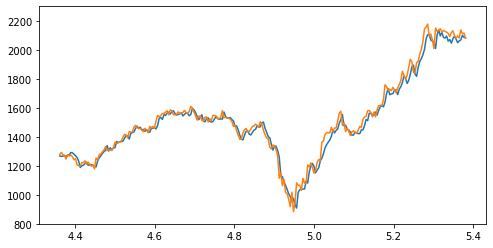

Test epoch:107 	Loss: 0.229331

Epoch: 108


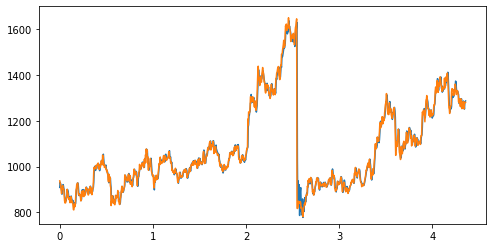

Train epoch:108 	Loss: -3.482546| Loss_in: 0.001546| Loss_out: 0.013086


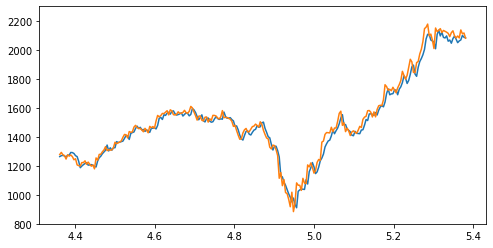

Test epoch:108 	Loss: 0.229092

Epoch: 109


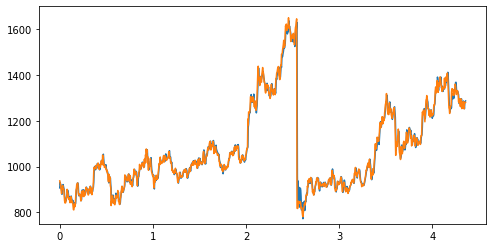

Train epoch:109 	Loss: -3.486825| Loss_in: 0.001520| Loss_out: 0.012974


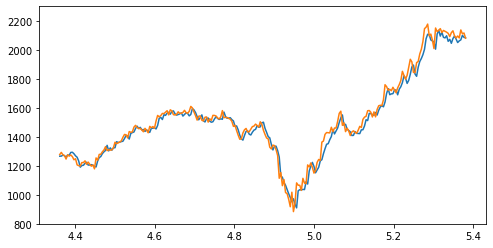

Test epoch:109 	Loss: 0.229578

Epoch: 110


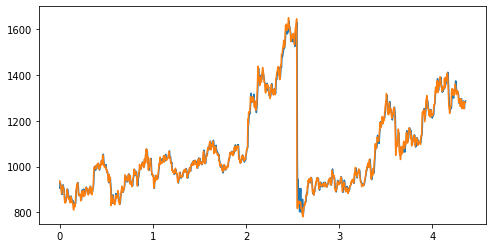

Train epoch:110 	Loss: -3.487899| Loss_in: 0.001541| Loss_out: 0.012912


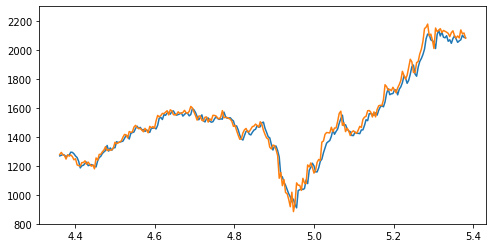

Test epoch:110 	Loss: 0.228130

Epoch: 111


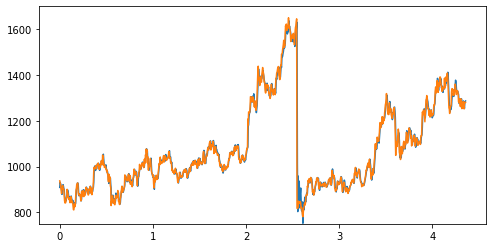

Train epoch:111 	Loss: -3.489516| Loss_in: 0.001558| Loss_out: 0.012883


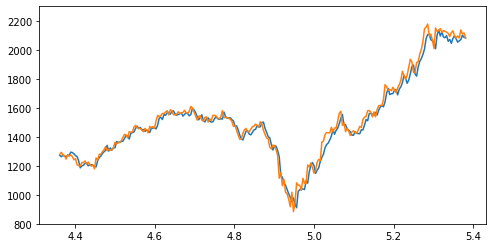

Test epoch:111 	Loss: 0.228359

Epoch: 112


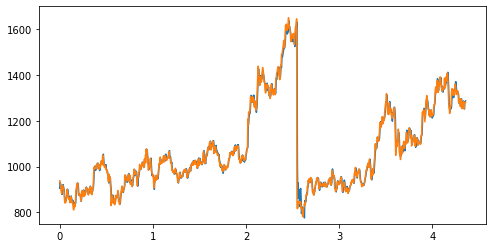

Train epoch:112 	Loss: -3.489956| Loss_in: 0.001572| Loss_out: 0.012727


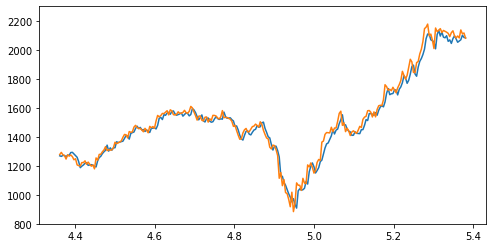

Test epoch:112 	Loss: 0.229458

Epoch: 113


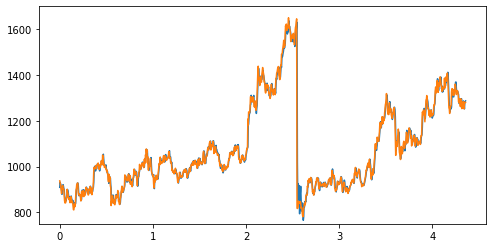

Train epoch:113 	Loss: -3.492719| Loss_in: 0.001497| Loss_out: 0.012682


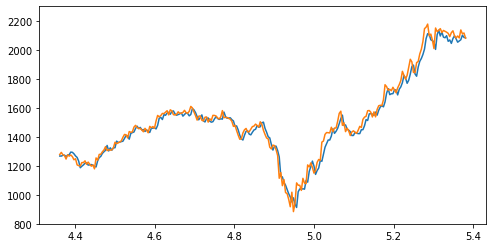

Test epoch:113 	Loss: 0.228902

Epoch: 114


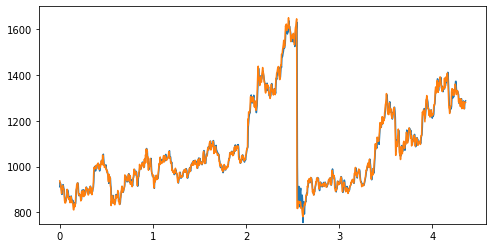

Train epoch:114 	Loss: -3.496627| Loss_in: 0.001535| Loss_out: 0.012620


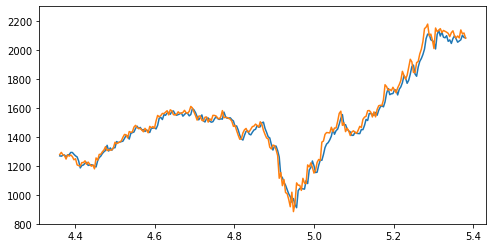

Test epoch:114 	Loss: 0.229315

Epoch: 115


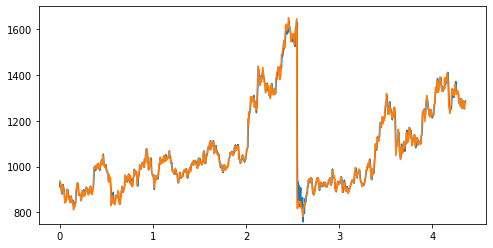

Train epoch:115 	Loss: -3.494955| Loss_in: 0.001520| Loss_out: 0.012562


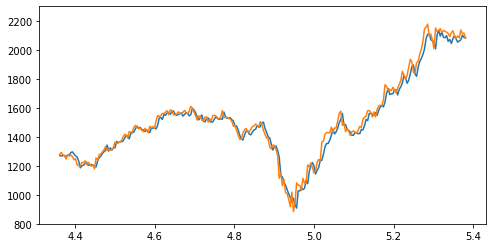

Test epoch:115 	Loss: 0.229668

Epoch: 116


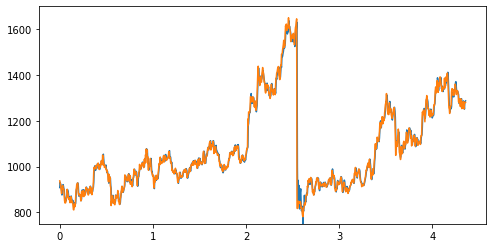

Train epoch:116 	Loss: -3.498842| Loss_in: 0.001483| Loss_out: 0.012373


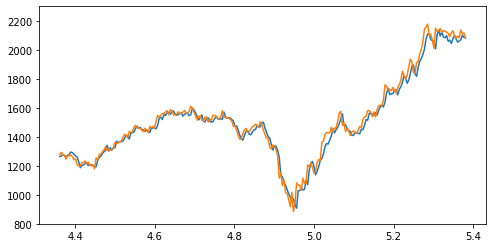

Test epoch:116 	Loss: 0.228607

Epoch: 117


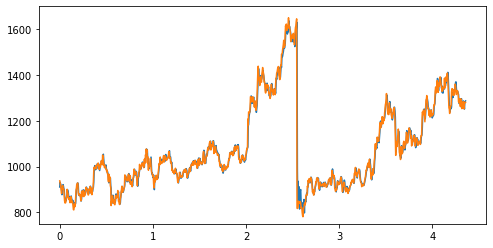

Train epoch:117 	Loss: -3.500257| Loss_in: 0.001506| Loss_out: 0.012387


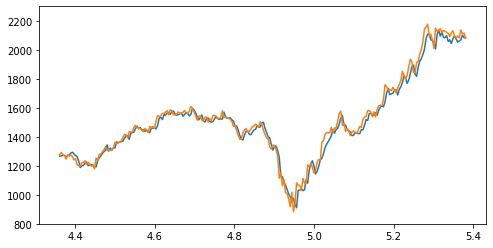

Test epoch:117 	Loss: 0.227768

Epoch: 118


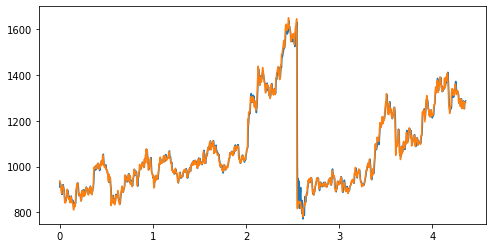

Train epoch:118 	Loss: -3.502925| Loss_in: 0.001496| Loss_out: 0.012323


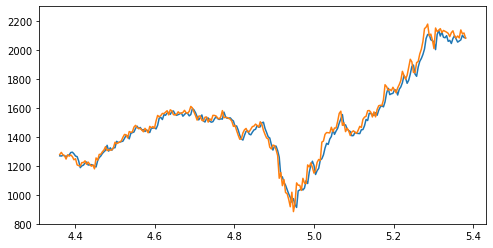

Test epoch:118 	Loss: 0.229780

Epoch: 119


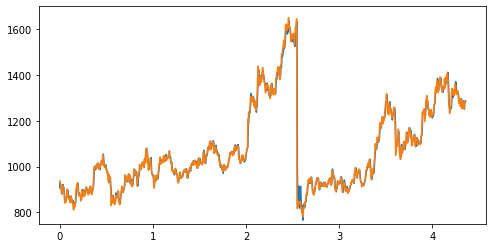

Train epoch:119 	Loss: -3.503766| Loss_in: 0.001509| Loss_out: 0.012308


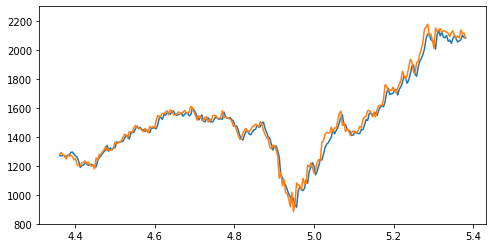

Test epoch:119 	Loss: 0.228180

Epoch: 120


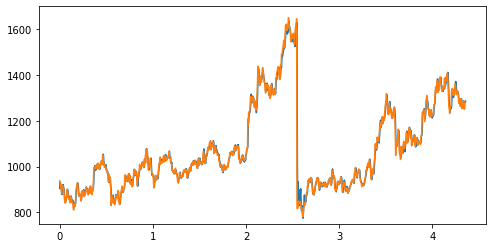

Train epoch:120 	Loss: -3.503161| Loss_in: 0.001487| Loss_out: 0.012321


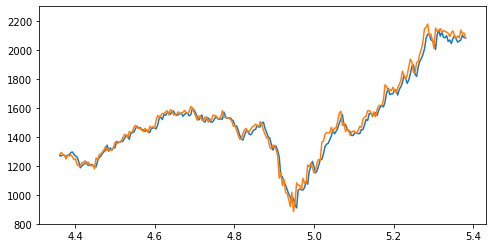

Test epoch:120 	Loss: 0.228691

Epoch: 121


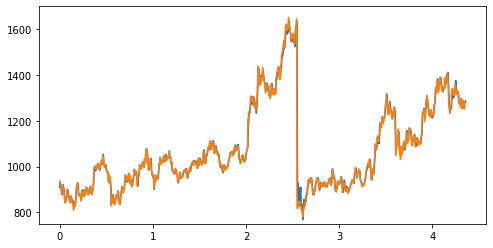

Train epoch:121 	Loss: -3.506406| Loss_in: 0.001476| Loss_out: 0.012136


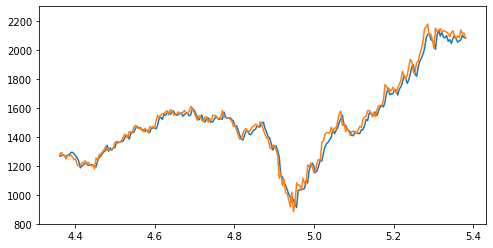

Test epoch:121 	Loss: 0.226590

Epoch: 122


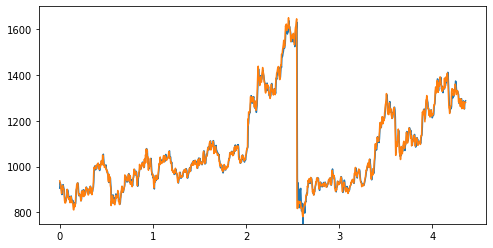

Train epoch:122 	Loss: -3.507801| Loss_in: 0.001502| Loss_out: 0.012112


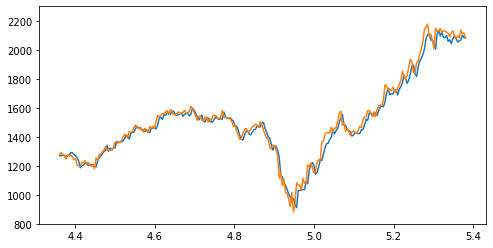

Test epoch:122 	Loss: 0.228876

Epoch: 123


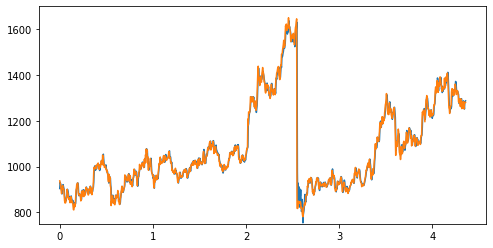

Train epoch:123 	Loss: -3.509186| Loss_in: 0.001487| Loss_out: 0.012006


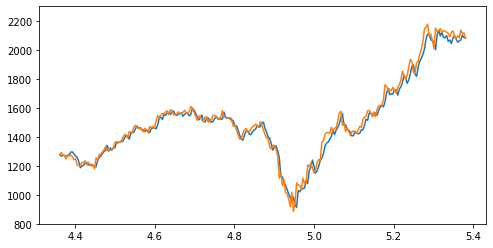

Test epoch:123 	Loss: 0.227682

Epoch: 124


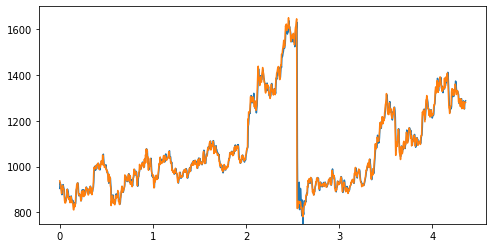

Train epoch:124 	Loss: -3.510365| Loss_in: 0.001502| Loss_out: 0.012047


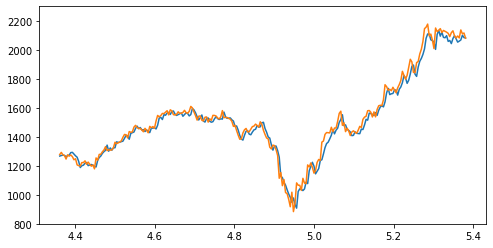

Test epoch:124 	Loss: 0.228401

Epoch: 125


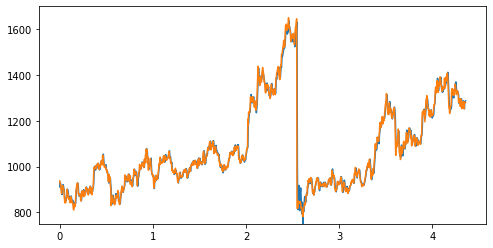

Train epoch:125 	Loss: -3.511757| Loss_in: 0.001483| Loss_out: 0.011915


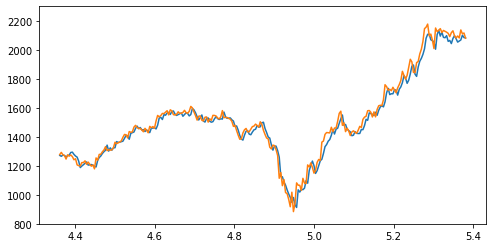

Test epoch:125 	Loss: 0.227119

Epoch: 126


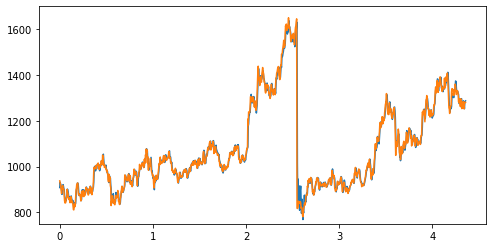

Train epoch:126 	Loss: -3.514013| Loss_in: 0.001489| Loss_out: 0.011852


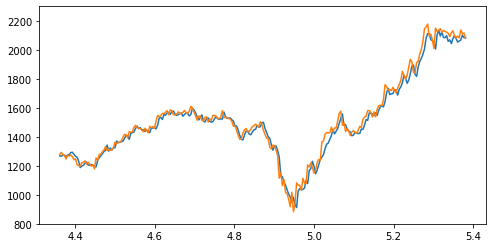

Test epoch:126 	Loss: 0.227476

Epoch: 127


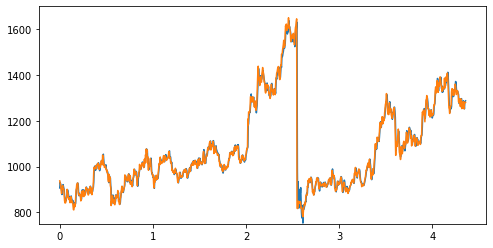

Train epoch:127 	Loss: -3.513713| Loss_in: 0.001454| Loss_out: 0.011820


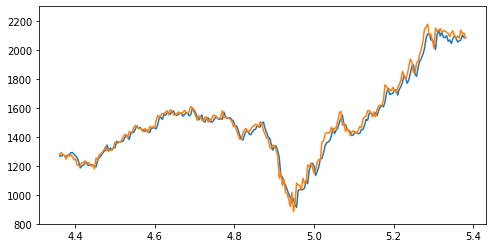

Test epoch:127 	Loss: 0.225659

Epoch: 128


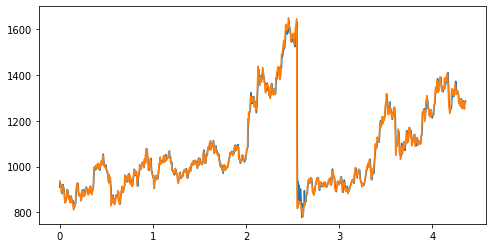

Train epoch:128 	Loss: -3.515833| Loss_in: 0.001492| Loss_out: 0.011734


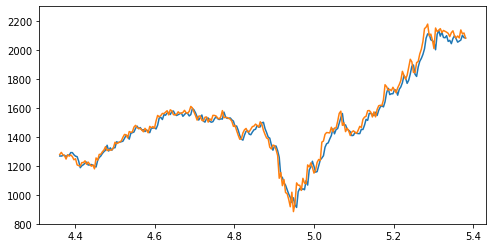

Test epoch:128 	Loss: 0.228489

Epoch: 129


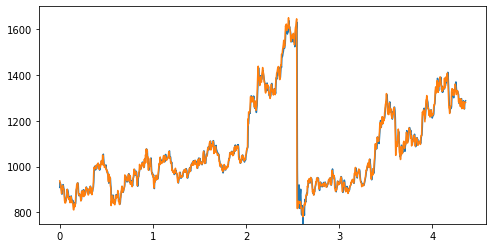

Train epoch:129 	Loss: -3.516034| Loss_in: 0.001455| Loss_out: 0.011667


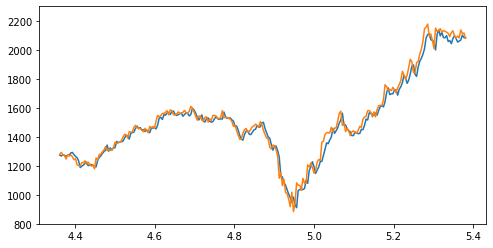

Test epoch:129 	Loss: 0.230528

Epoch: 130


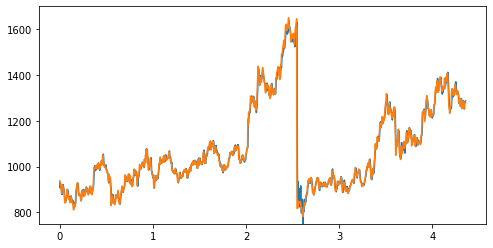

Train epoch:130 	Loss: -3.518610| Loss_in: 0.001448| Loss_out: 0.011636


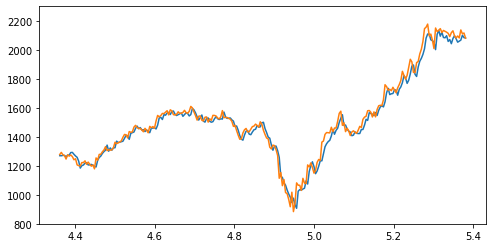

Test epoch:130 	Loss: 0.227841

Epoch: 131


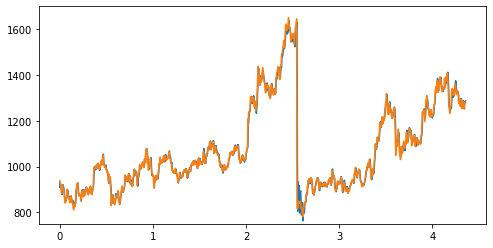

Train epoch:131 	Loss: -3.521328| Loss_in: 0.001468| Loss_out: 0.011619


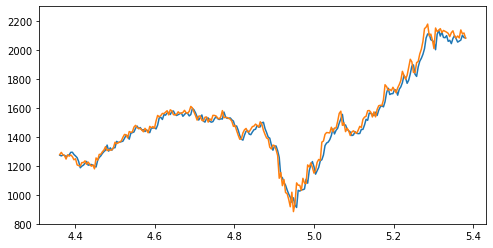

Test epoch:131 	Loss: 0.226826

Epoch: 132


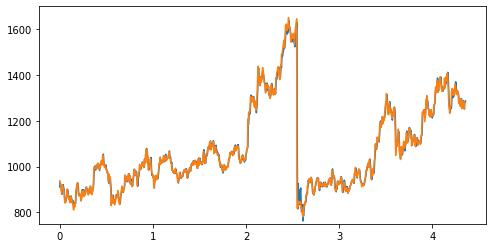

Train epoch:132 	Loss: -3.520444| Loss_in: 0.001419| Loss_out: 0.011625


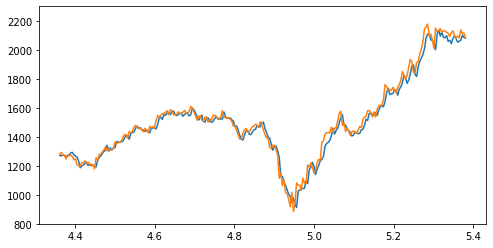

Test epoch:132 	Loss: 0.227161

Epoch: 133


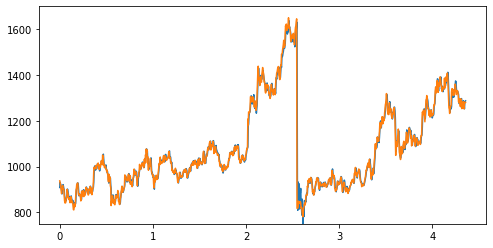

Train epoch:133 	Loss: -3.522409| Loss_in: 0.001509| Loss_out: 0.011552


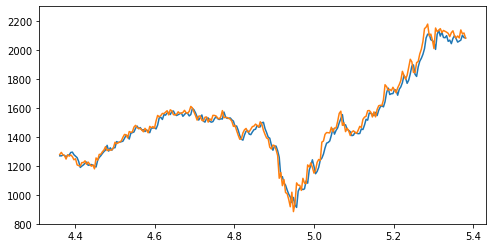

Test epoch:133 	Loss: 0.226971

Epoch: 134


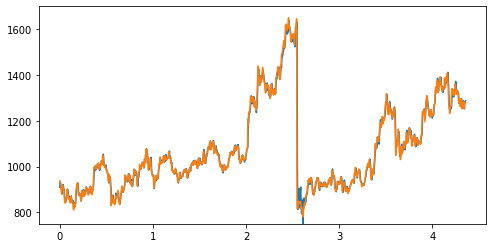

Train epoch:134 	Loss: -3.524329| Loss_in: 0.001441| Loss_out: 0.011444


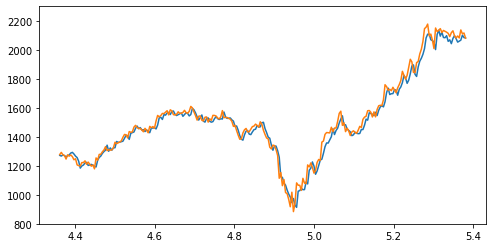

Test epoch:134 	Loss: 0.226952

Epoch: 135


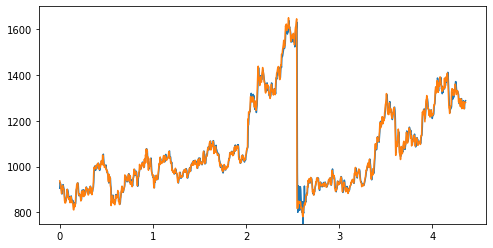

Train epoch:135 	Loss: -3.526218| Loss_in: 0.001435| Loss_out: 0.011519


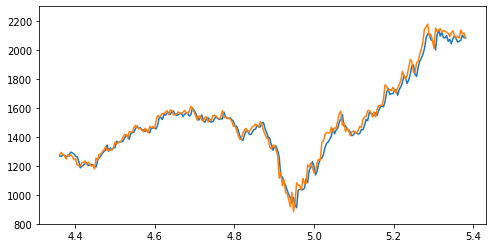

Test epoch:135 	Loss: 0.226719

Epoch: 136


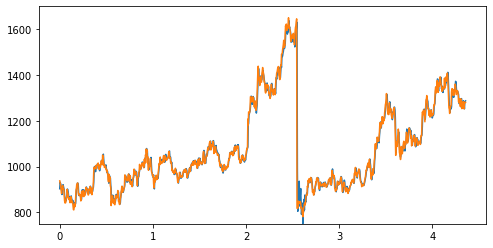

Train epoch:136 	Loss: -3.525950| Loss_in: 0.001449| Loss_out: 0.011416


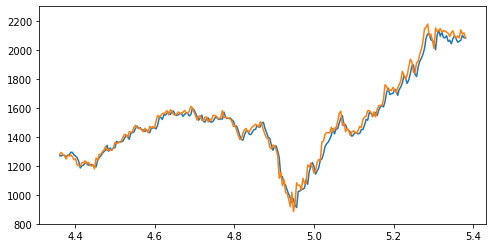

Test epoch:136 	Loss: 0.226863

Epoch: 137


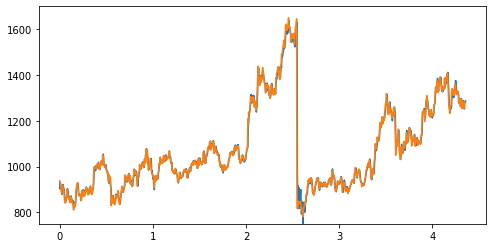

Train epoch:137 	Loss: -3.529809| Loss_in: 0.001436| Loss_out: 0.011325


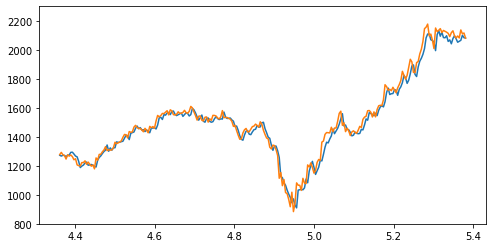

Test epoch:137 	Loss: 0.228462

Epoch: 138


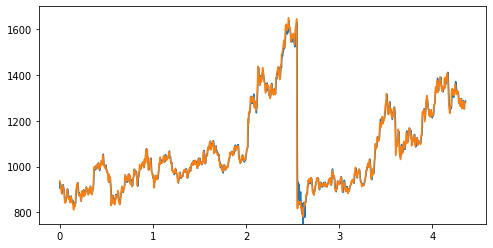

Train epoch:138 	Loss: -3.528929| Loss_in: 0.001472| Loss_out: 0.011280


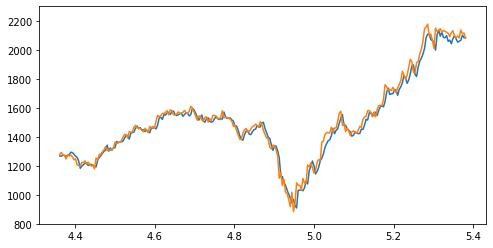

Test epoch:138 	Loss: 0.226828

Epoch: 139


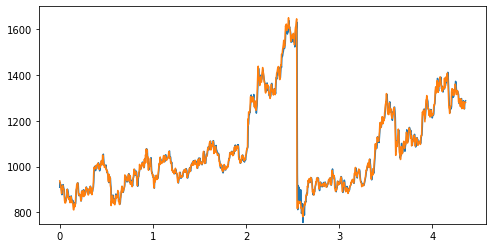

Train epoch:139 	Loss: -3.531890| Loss_in: 0.001472| Loss_out: 0.011215


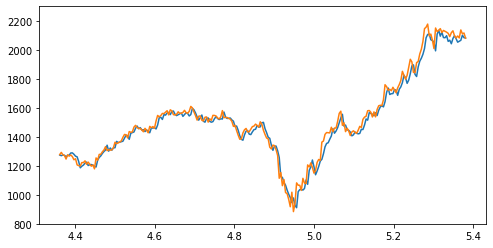

Test epoch:139 	Loss: 0.227901

Epoch: 140


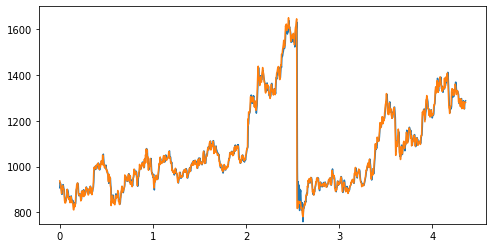

Train epoch:140 	Loss: -3.533633| Loss_in: 0.001428| Loss_out: 0.011206


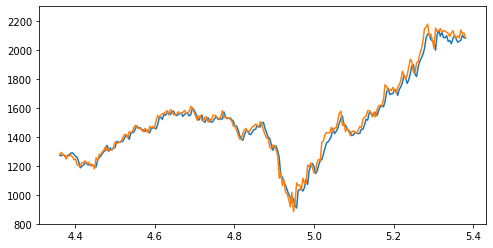

Test epoch:140 	Loss: 0.226960

Epoch: 141


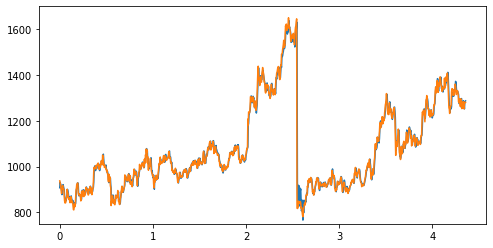

Train epoch:141 	Loss: -3.533719| Loss_in: 0.001436| Loss_out: 0.011085


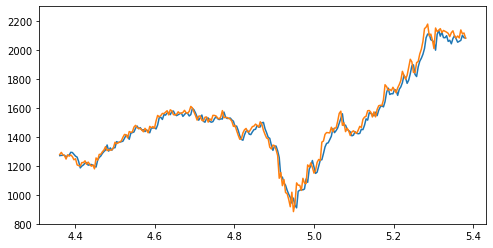

Test epoch:141 	Loss: 0.227273

Epoch: 142


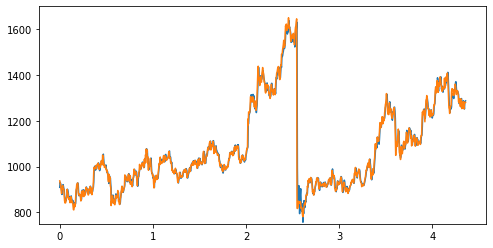

Train epoch:142 	Loss: -3.533660| Loss_in: 0.001454| Loss_out: 0.011164


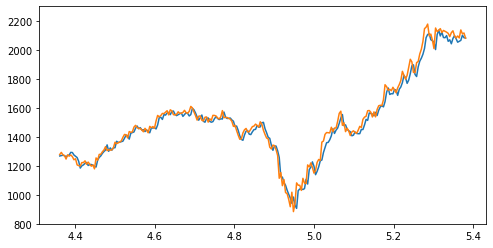

Test epoch:142 	Loss: 0.227571

Epoch: 143


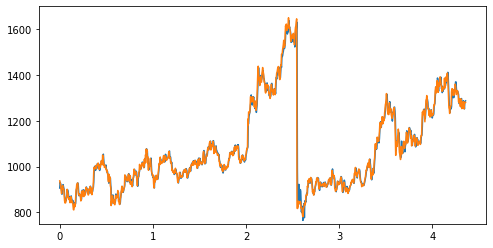

Train epoch:143 	Loss: -3.537804| Loss_in: 0.001462| Loss_out: 0.010999


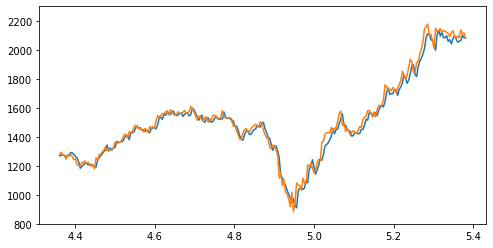

Test epoch:143 	Loss: 0.226692

Epoch: 144


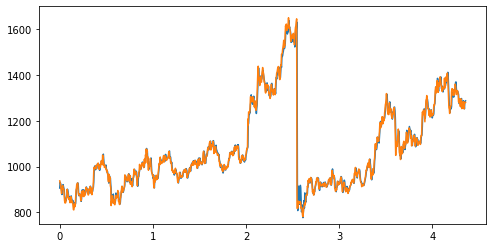

Train epoch:144 	Loss: -3.537494| Loss_in: 0.001459| Loss_out: 0.010895


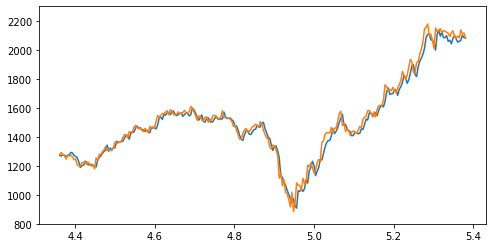

Test epoch:144 	Loss: 0.227022

Epoch: 145


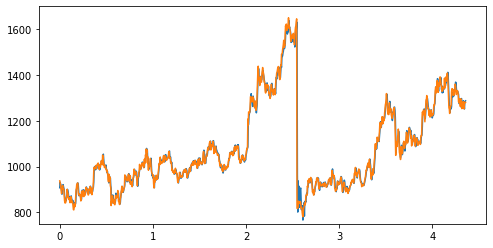

Train epoch:145 	Loss: -3.537436| Loss_in: 0.001444| Loss_out: 0.010816


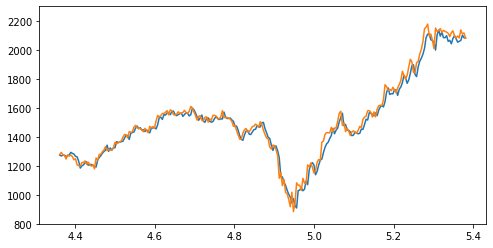

Test epoch:145 	Loss: 0.226866

Epoch: 146


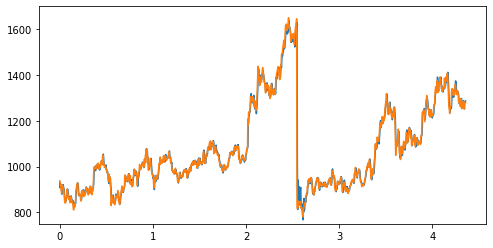

Train epoch:146 	Loss: -3.541109| Loss_in: 0.001414| Loss_out: 0.010803


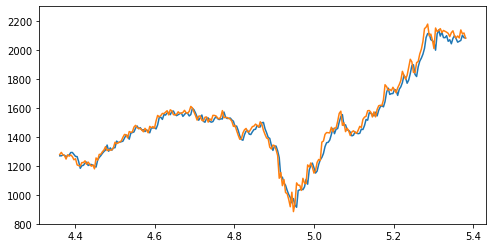

Test epoch:146 	Loss: 0.223459

Epoch: 147


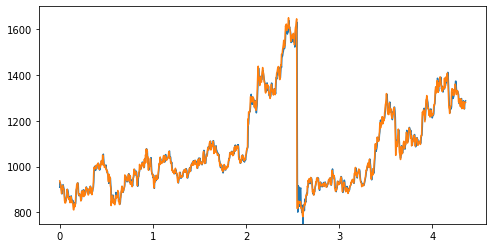

Train epoch:147 	Loss: -3.541389| Loss_in: 0.001423| Loss_out: 0.010834


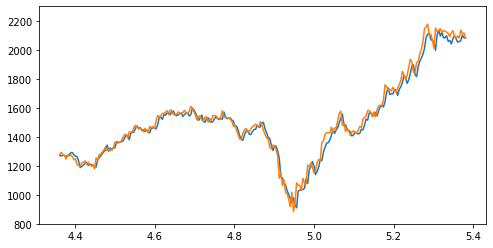

Test epoch:147 	Loss: 0.227593

Epoch: 148


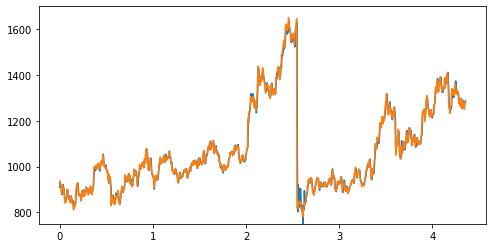

Train epoch:148 	Loss: -3.541091| Loss_in: 0.001414| Loss_out: 0.010786


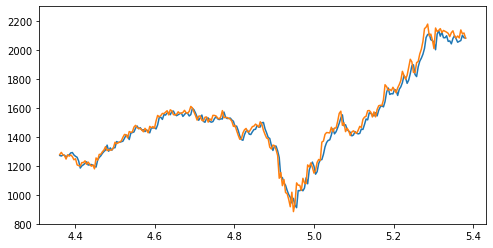

Test epoch:148 	Loss: 0.225956

Epoch: 149


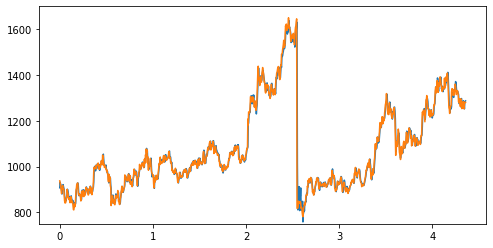

Train epoch:149 	Loss: -3.544387| Loss_in: 0.001417| Loss_out: 0.010688


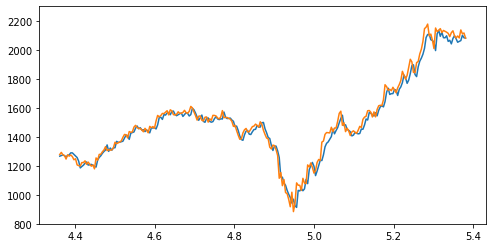

Test epoch:149 	Loss: 0.227343

Epoch: 150


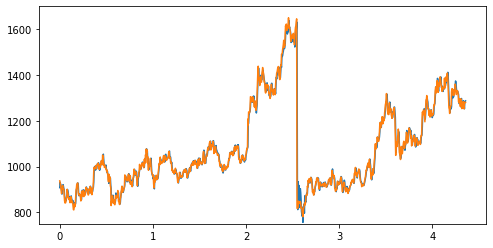

Train epoch:150 	Loss: -3.544532| Loss_in: 0.001395| Loss_out: 0.010618


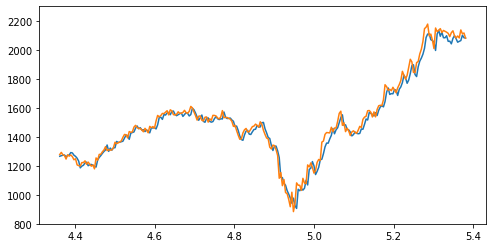

Test epoch:150 	Loss: 0.227009

Epoch: 151


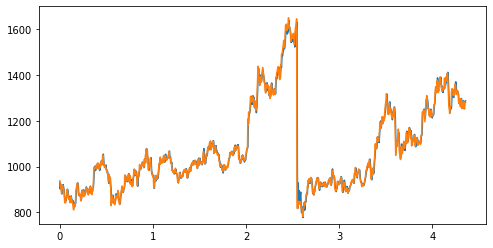

Train epoch:151 	Loss: -3.544165| Loss_in: 0.001372| Loss_out: 0.010561


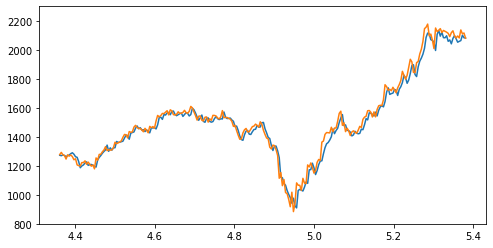

Test epoch:151 	Loss: 0.226584

Epoch: 152


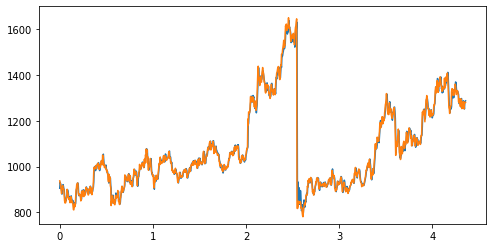

Train epoch:152 	Loss: -3.546921| Loss_in: 0.001444| Loss_out: 0.010593


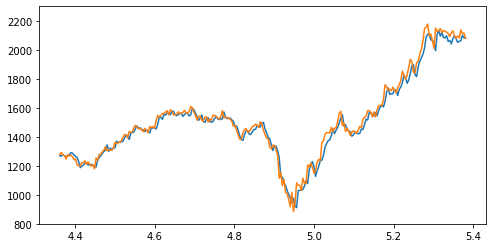

Test epoch:152 	Loss: 0.226246

Epoch: 153


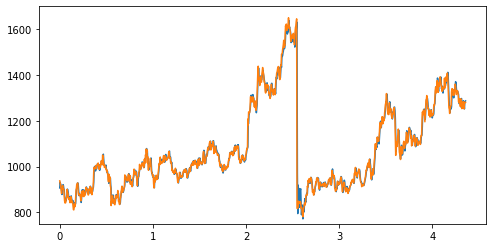

Train epoch:153 	Loss: -3.546648| Loss_in: 0.001403| Loss_out: 0.010536


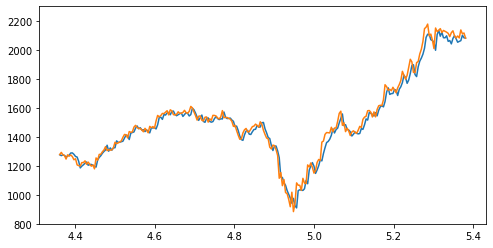

Test epoch:153 	Loss: 0.226139

Epoch: 154


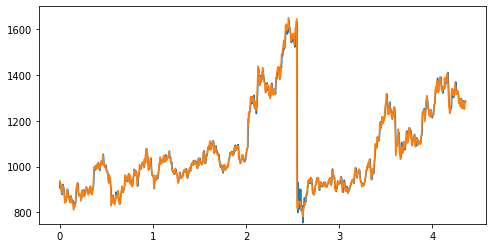

Train epoch:154 	Loss: -3.550036| Loss_in: 0.001410| Loss_out: 0.010507


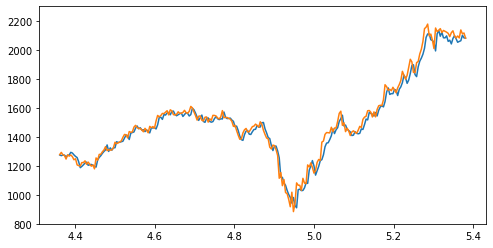

Test epoch:154 	Loss: 0.226363

Epoch: 155


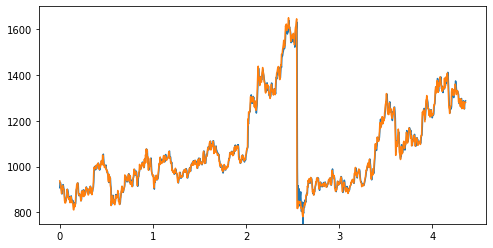

Train epoch:155 	Loss: -3.550670| Loss_in: 0.001411| Loss_out: 0.010676


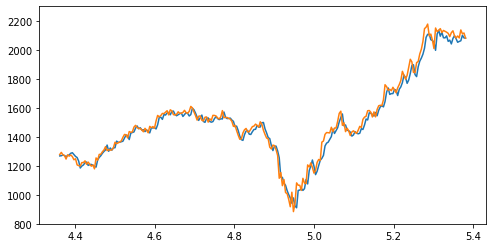

Test epoch:155 	Loss: 0.226465

Epoch: 156


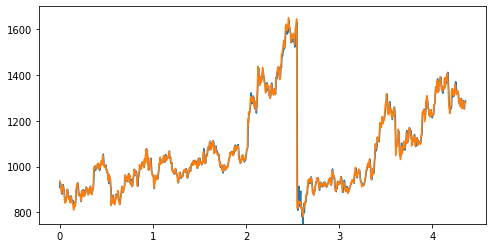

Train epoch:156 	Loss: -3.551893| Loss_in: 0.001398| Loss_out: 0.010561


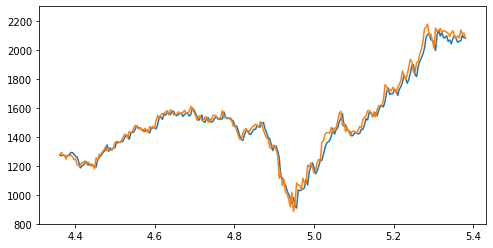

Test epoch:156 	Loss: 0.227358

Epoch: 157


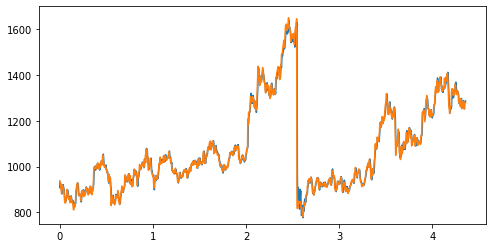

Train epoch:157 	Loss: -3.553939| Loss_in: 0.001403| Loss_out: 0.010431


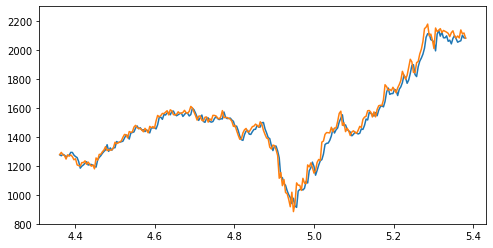

Test epoch:157 	Loss: 0.224738

Epoch: 158


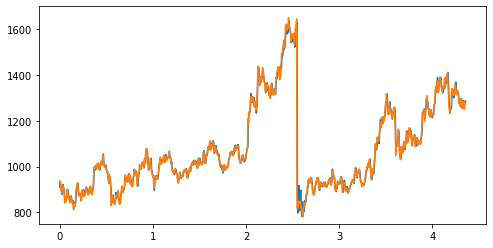

Train epoch:158 	Loss: -3.552052| Loss_in: 0.001418| Loss_out: 0.010388


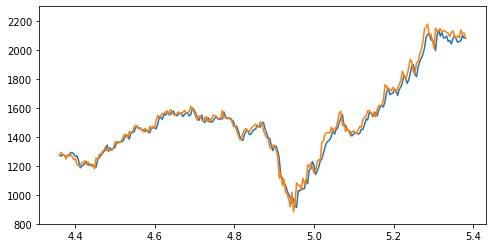

Test epoch:158 	Loss: 0.226255

Epoch: 159


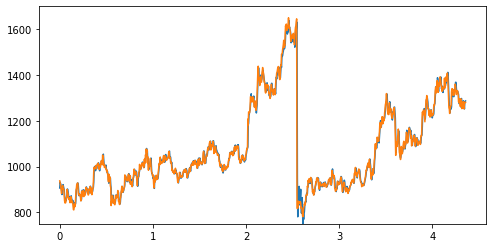

Train epoch:159 	Loss: -3.553828| Loss_in: 0.001402| Loss_out: 0.010243


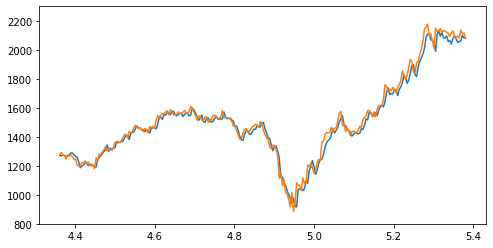

Test epoch:159 	Loss: 0.224747

Epoch: 160


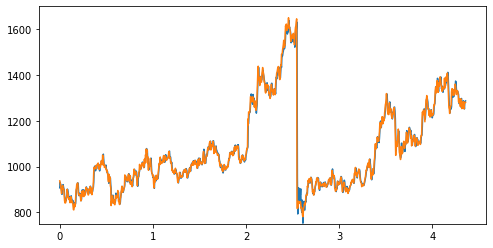

Train epoch:160 	Loss: -3.556226| Loss_in: 0.001350| Loss_out: 0.010244


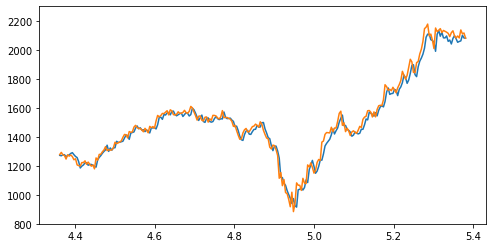

Test epoch:160 	Loss: 0.224193

Epoch: 161


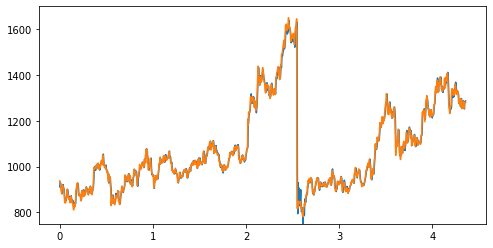

Train epoch:161 	Loss: -3.555841| Loss_in: 0.001365| Loss_out: 0.010312


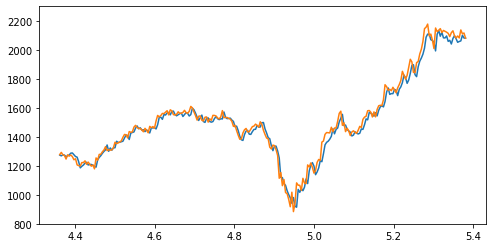

Test epoch:161 	Loss: 0.226686

Epoch: 162


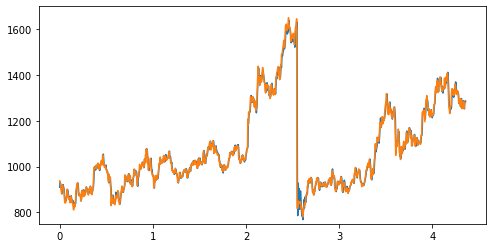

Train epoch:162 	Loss: -3.556569| Loss_in: 0.001389| Loss_out: 0.010282


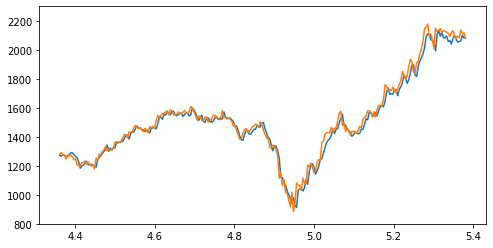

Test epoch:162 	Loss: 0.224802

Epoch: 163


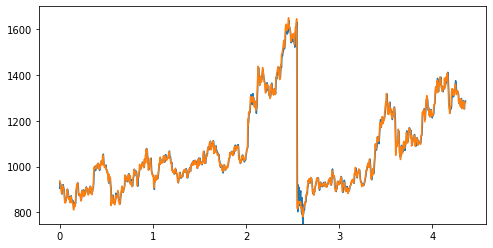

Train epoch:163 	Loss: -3.557203| Loss_in: 0.001343| Loss_out: 0.010152


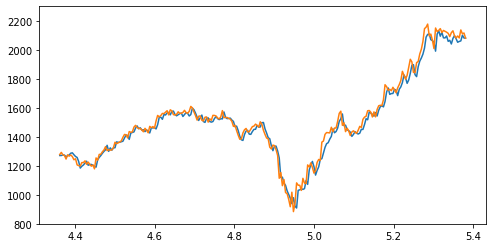

Test epoch:163 	Loss: 0.226090

Epoch: 164


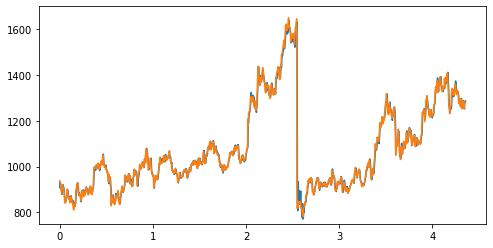

Train epoch:164 	Loss: -3.557968| Loss_in: 0.001393| Loss_out: 0.010307


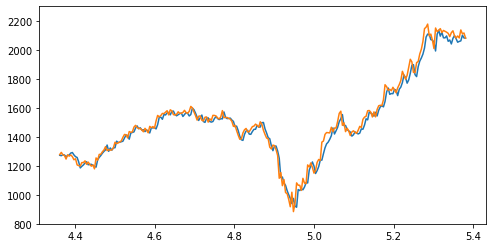

Test epoch:164 	Loss: 0.224658

Epoch: 165


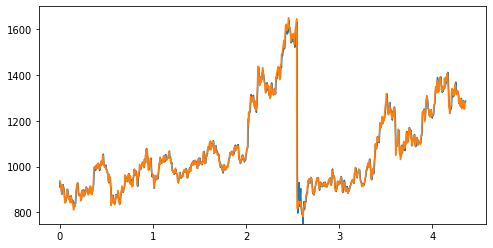

Train epoch:165 	Loss: -3.560745| Loss_in: 0.001384| Loss_out: 0.010240


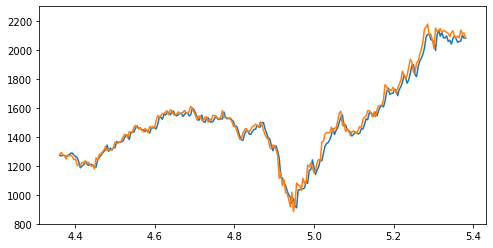

Test epoch:165 	Loss: 0.225185

Epoch: 166


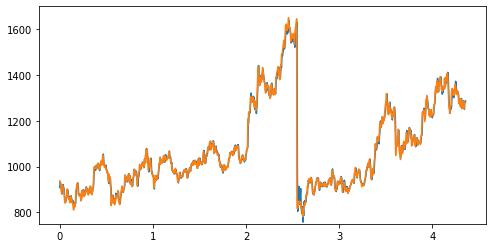

Train epoch:166 	Loss: -3.562604| Loss_in: 0.001387| Loss_out: 0.010097


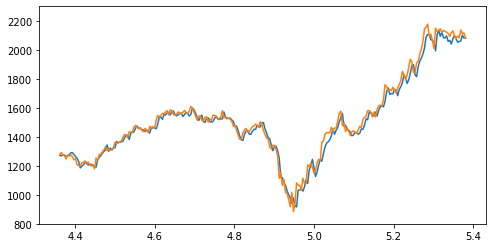

Test epoch:166 	Loss: 0.226558

Epoch: 167


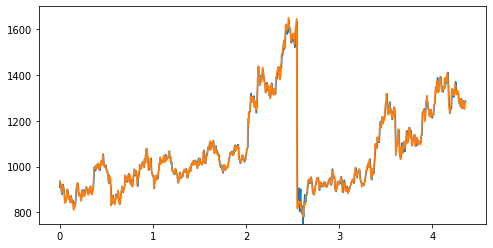

Train epoch:167 	Loss: -3.564235| Loss_in: 0.001346| Loss_out: 0.010143


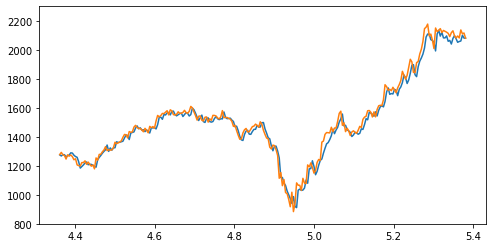

Test epoch:167 	Loss: 0.226162

Epoch: 168


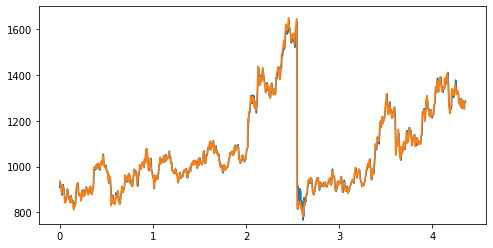

Train epoch:168 	Loss: -3.563594| Loss_in: 0.001345| Loss_out: 0.010069


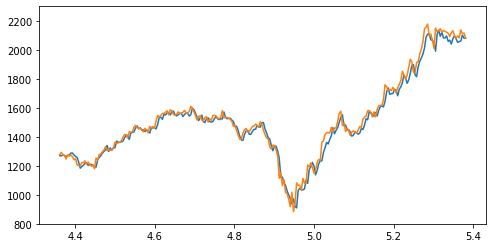

Test epoch:168 	Loss: 0.225553

Epoch: 169


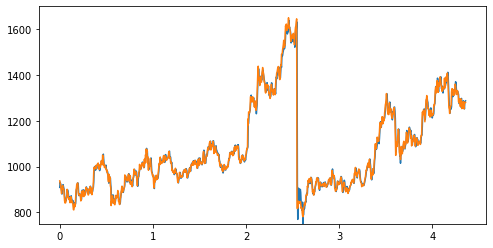

Train epoch:169 	Loss: -3.564808| Loss_in: 0.001359| Loss_out: 0.010058


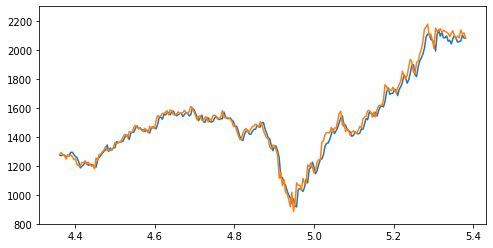

Test epoch:169 	Loss: 0.223353

Epoch: 170


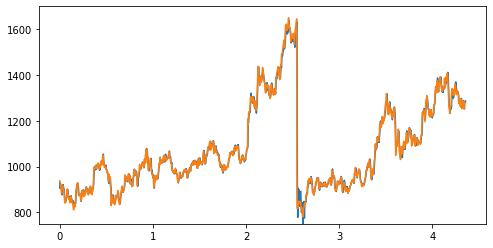

Train epoch:170 	Loss: -3.565083| Loss_in: 0.001346| Loss_out: 0.010035


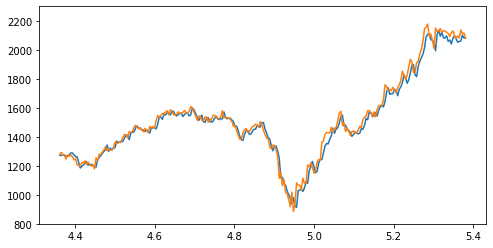

Test epoch:170 	Loss: 0.224924

Epoch: 171


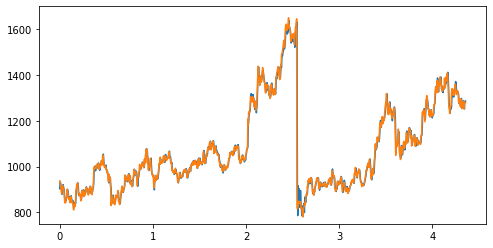

Train epoch:171 	Loss: -3.566115| Loss_in: 0.001320| Loss_out: 0.010045


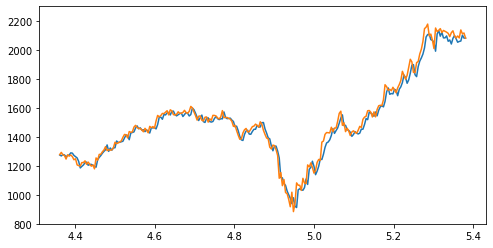

Test epoch:171 	Loss: 0.225880

Epoch: 172


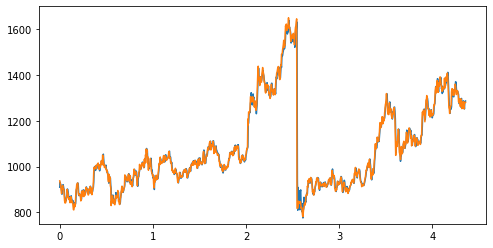

Train epoch:172 	Loss: -3.568411| Loss_in: 0.001320| Loss_out: 0.009933


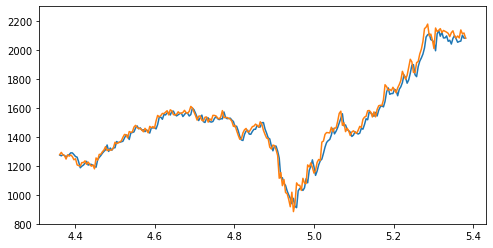

Test epoch:172 	Loss: 0.224683

Epoch: 173


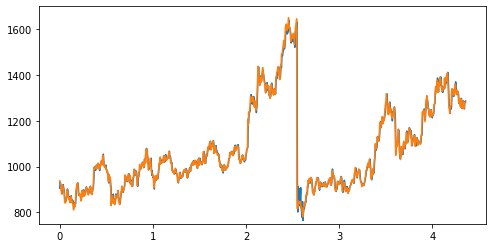

Train epoch:173 	Loss: -3.568770| Loss_in: 0.001331| Loss_out: 0.010016


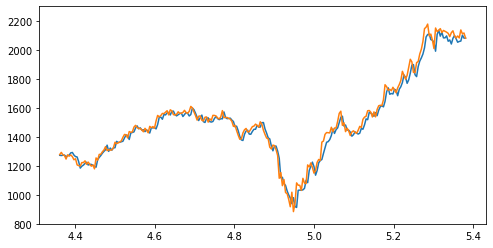

Test epoch:173 	Loss: 0.223618

Epoch: 174


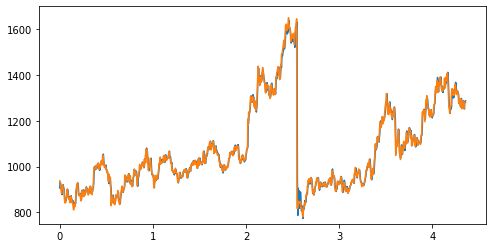

Train epoch:174 	Loss: -3.571344| Loss_in: 0.001292| Loss_out: 0.009801


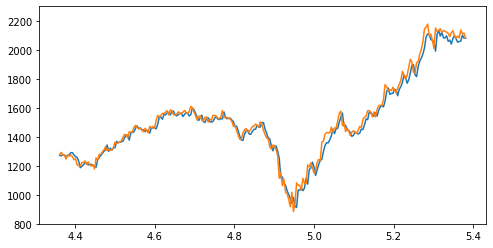

Test epoch:174 	Loss: 0.224678

Epoch: 175


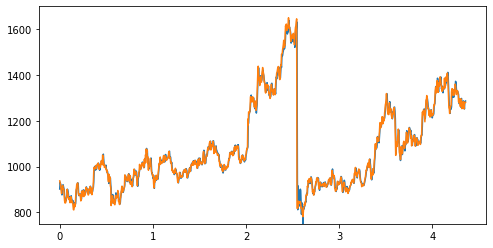

Train epoch:175 	Loss: -3.571519| Loss_in: 0.001320| Loss_out: 0.009803


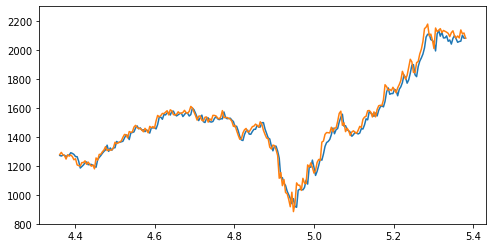

Test epoch:175 	Loss: 0.224420

Epoch: 176


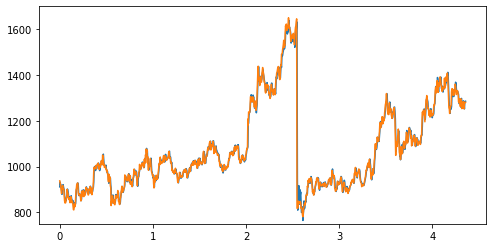

Train epoch:176 	Loss: -3.574021| Loss_in: 0.001334| Loss_out: 0.009892


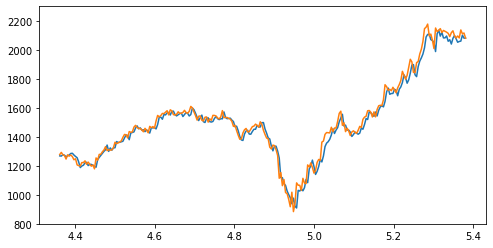

Test epoch:176 	Loss: 0.226726

Epoch: 177


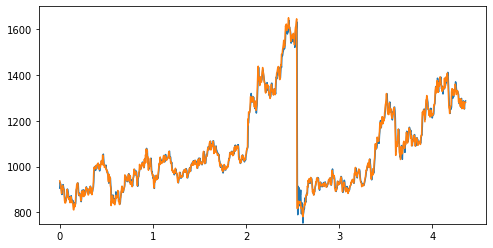

Train epoch:177 	Loss: -3.573461| Loss_in: 0.001317| Loss_out: 0.009780


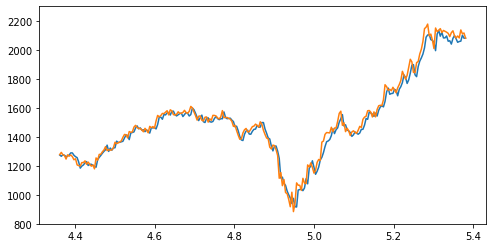

Test epoch:177 	Loss: 0.223112

Epoch: 178


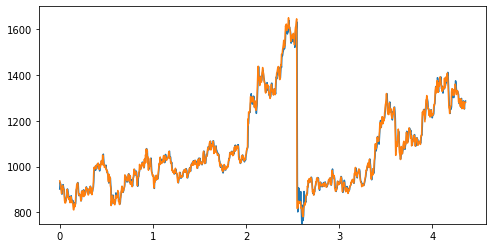

Train epoch:178 	Loss: -3.574405| Loss_in: 0.001314| Loss_out: 0.009718


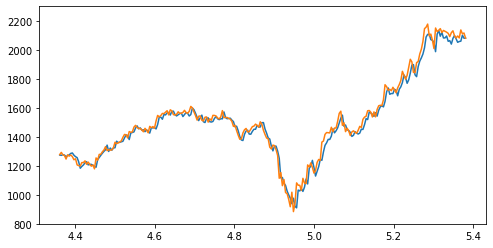

Test epoch:178 	Loss: 0.225153

Epoch: 179


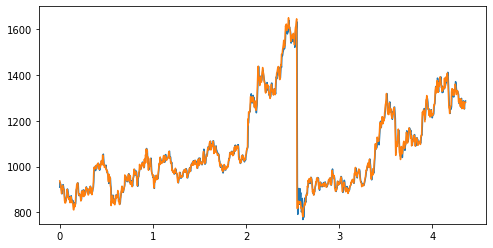

Train epoch:179 	Loss: -3.577959| Loss_in: 0.001325| Loss_out: 0.009709


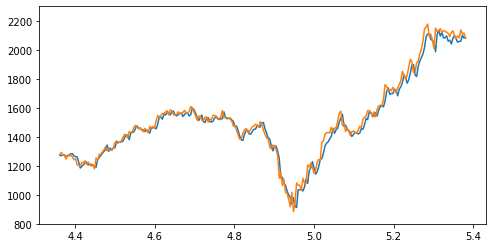

Test epoch:179 	Loss: 0.224289

Epoch: 180


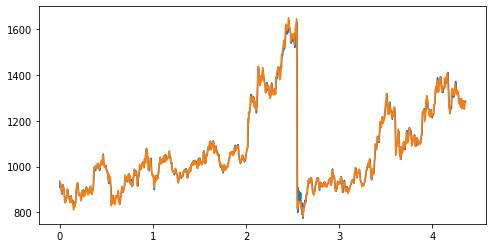

Train epoch:180 	Loss: -3.576713| Loss_in: 0.001323| Loss_out: 0.009746


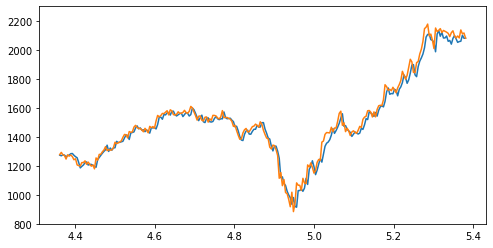

Test epoch:180 	Loss: 0.227434

Epoch: 181


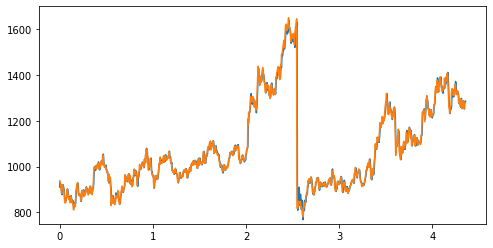

Train epoch:181 	Loss: -3.578280| Loss_in: 0.001269| Loss_out: 0.009627


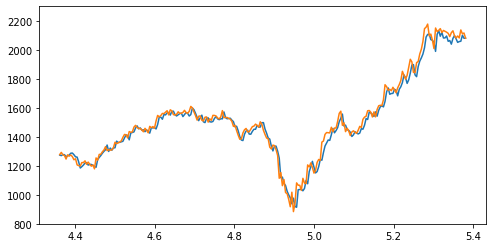

Test epoch:181 	Loss: 0.224903

Epoch: 182


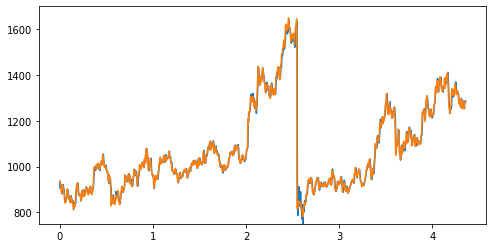

Train epoch:182 	Loss: -3.579959| Loss_in: 0.001301| Loss_out: 0.009601


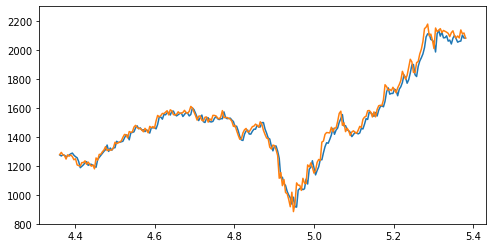

Test epoch:182 	Loss: 0.224424

Epoch: 183


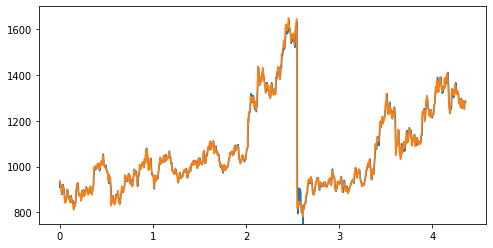

Train epoch:183 	Loss: -3.578637| Loss_in: 0.001313| Loss_out: 0.009757


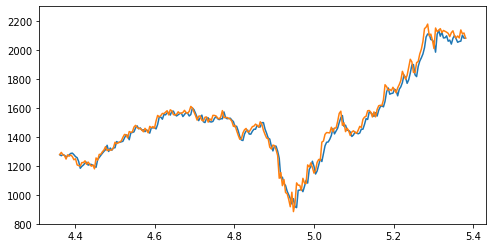

Test epoch:183 	Loss: 0.224837

Epoch: 184


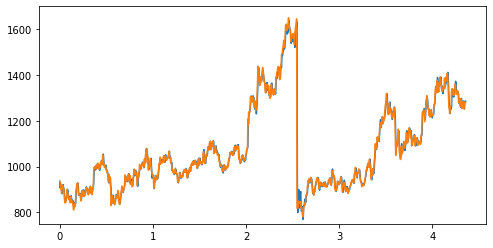

Train epoch:184 	Loss: -3.580765| Loss_in: 0.001289| Loss_out: 0.009558


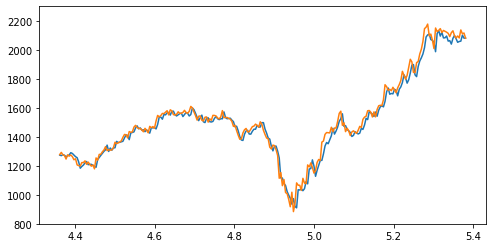

Test epoch:184 	Loss: 0.226329

Epoch: 185


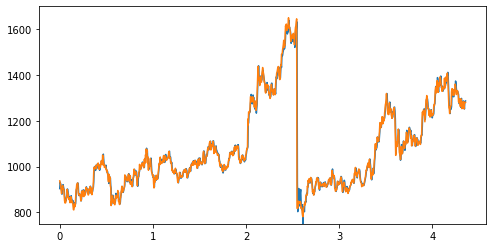

Train epoch:185 	Loss: -3.583265| Loss_in: 0.001298| Loss_out: 0.009602


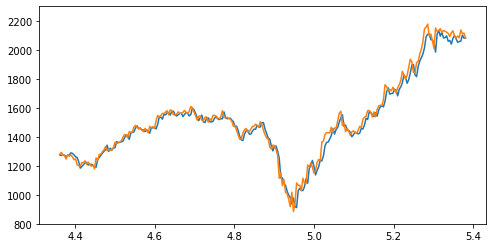

Test epoch:185 	Loss: 0.225533

Epoch: 186


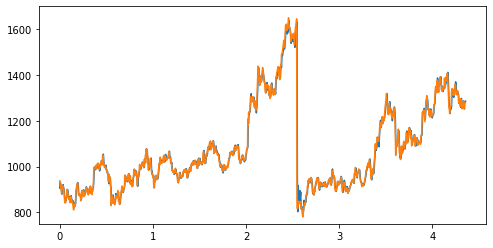

Train epoch:186 	Loss: -3.584670| Loss_in: 0.001298| Loss_out: 0.009570


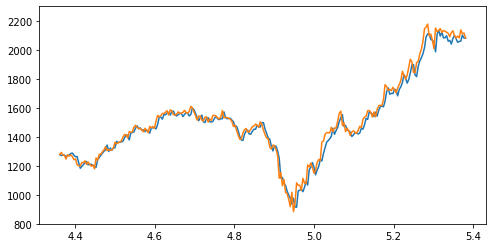

Test epoch:186 	Loss: 0.225344

Epoch: 187


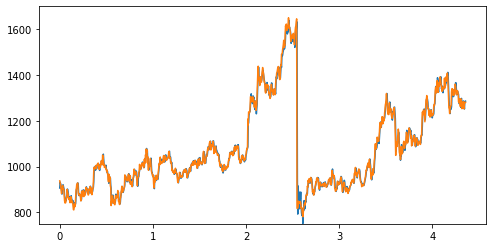

Train epoch:187 	Loss: -3.585944| Loss_in: 0.001297| Loss_out: 0.009420


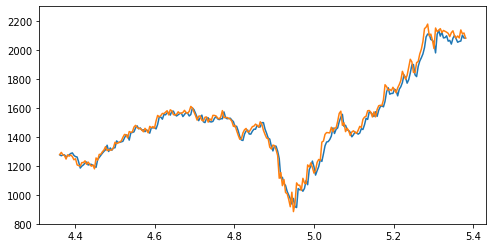

Test epoch:187 	Loss: 0.225768

Epoch: 188


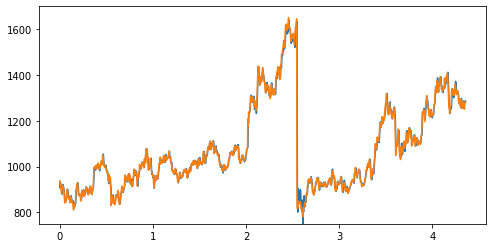

Train epoch:188 	Loss: -3.585629| Loss_in: 0.001303| Loss_out: 0.009475


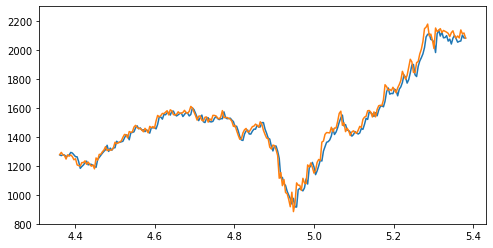

Test epoch:188 	Loss: 0.223696

Epoch: 189


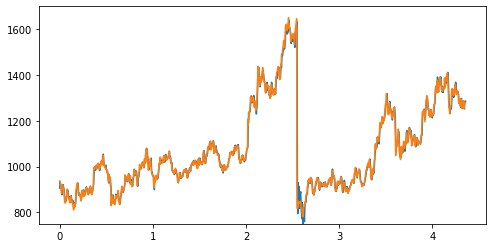

Train epoch:189 	Loss: -3.587383| Loss_in: 0.001293| Loss_out: 0.009571


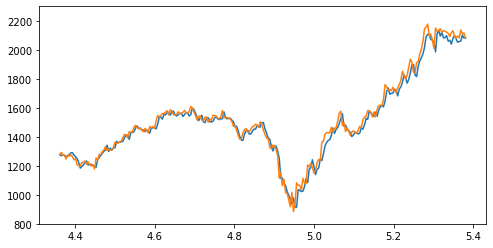

Test epoch:189 	Loss: 0.224456

Epoch: 190


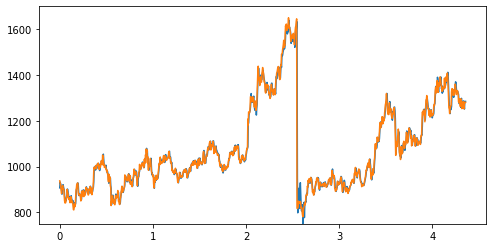

Train epoch:190 	Loss: -3.587900| Loss_in: 0.001323| Loss_out: 0.009460


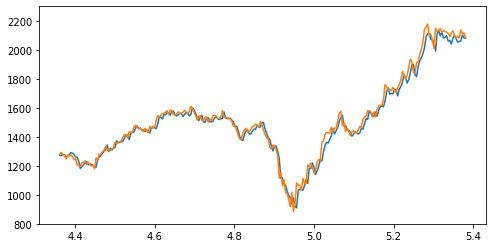

Test epoch:190 	Loss: 0.222930

Epoch: 191


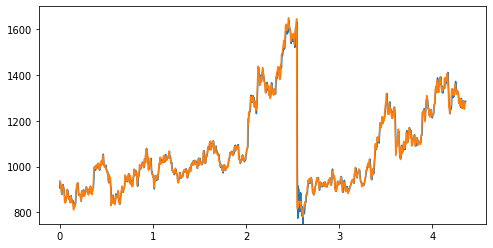

Train epoch:191 	Loss: -3.588453| Loss_in: 0.001280| Loss_out: 0.009322


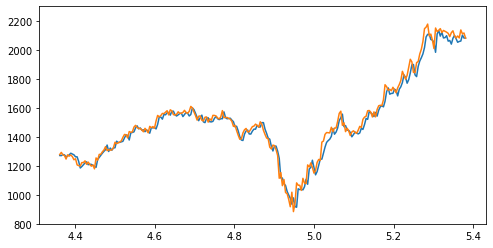

Test epoch:191 	Loss: 0.224073

Epoch: 192


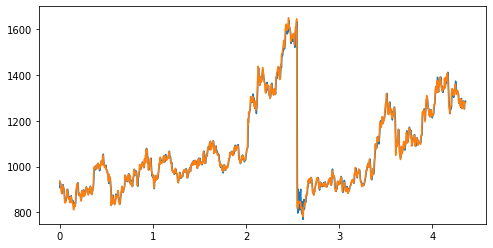

Train epoch:192 	Loss: -3.590534| Loss_in: 0.001285| Loss_out: 0.009301


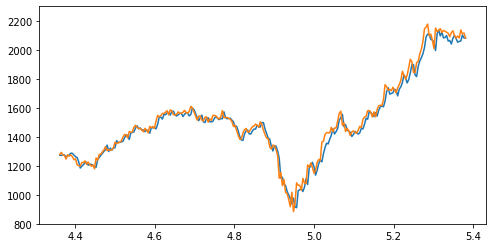

Test epoch:192 	Loss: 0.224569

Epoch: 193


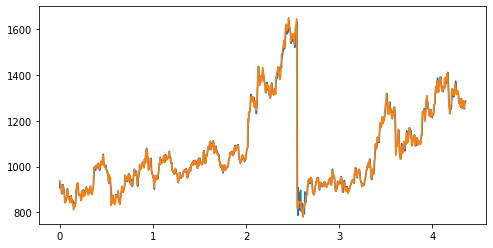

Train epoch:193 	Loss: -3.590631| Loss_in: 0.001282| Loss_out: 0.009293


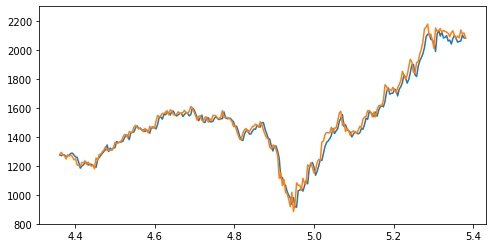

Test epoch:193 	Loss: 0.223236

Epoch: 194


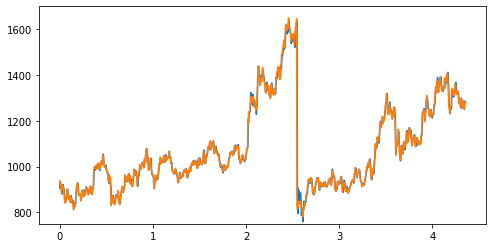

Train epoch:194 	Loss: -3.594264| Loss_in: 0.001261| Loss_out: 0.009308


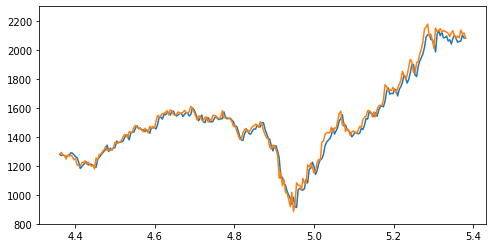

Test epoch:194 	Loss: 0.222507

Epoch: 195


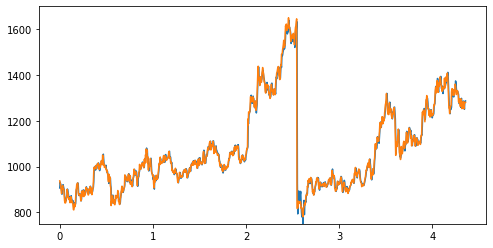

Train epoch:195 	Loss: -3.595945| Loss_in: 0.001279| Loss_out: 0.009348


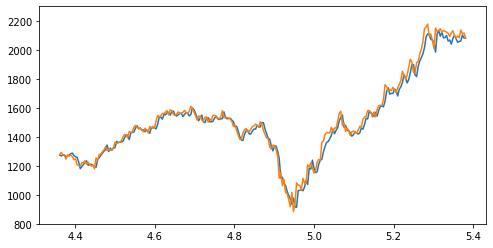

Test epoch:195 	Loss: 0.222476

Epoch: 196


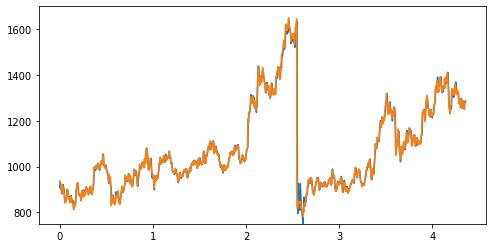

Train epoch:196 	Loss: -3.597460| Loss_in: 0.001273| Loss_out: 0.009258


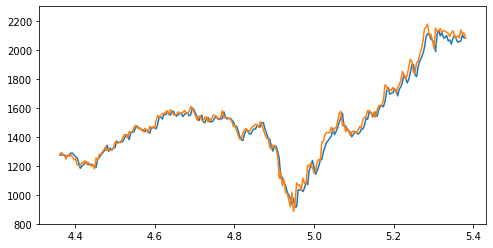

Test epoch:196 	Loss: 0.222507

Epoch: 197


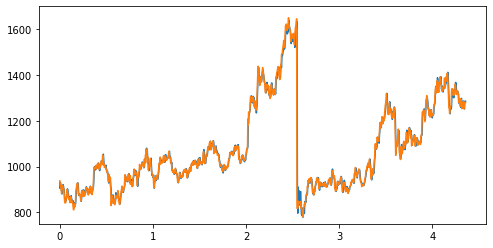

Train epoch:197 	Loss: -3.596320| Loss_in: 0.001259| Loss_out: 0.009319


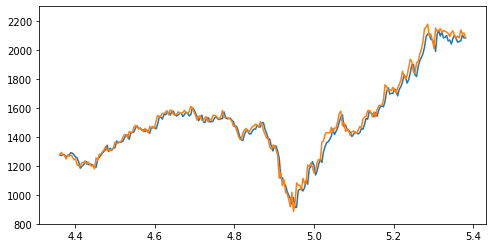

Test epoch:197 	Loss: 0.223887

Epoch: 198


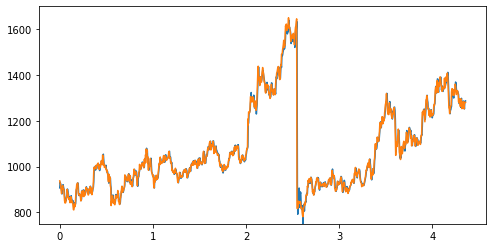

Train epoch:198 	Loss: -3.601169| Loss_in: 0.001276| Loss_out: 0.009185


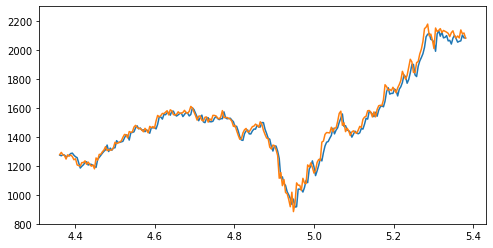

Test epoch:198 	Loss: 0.221771

Epoch: 199


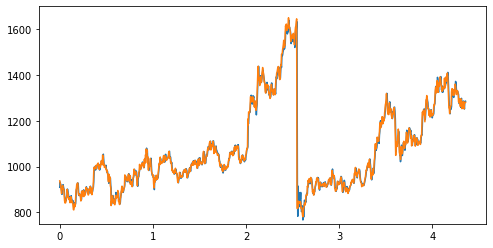

Train epoch:199 	Loss: -3.598817| Loss_in: 0.001250| Loss_out: 0.009252


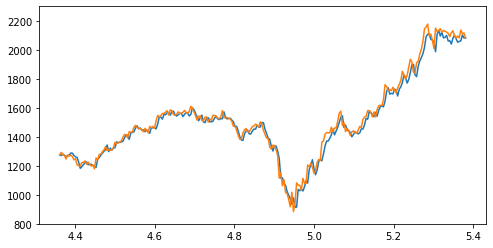

Test epoch:199 	Loss: 0.221529

Epoch: 200


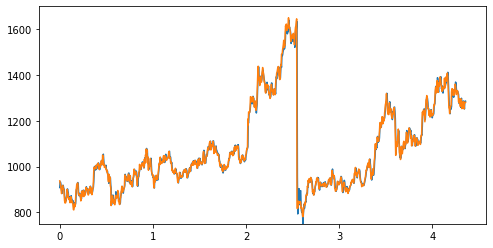

Train epoch:200 	Loss: -3.600346| Loss_in: 0.001271| Loss_out: 0.009230


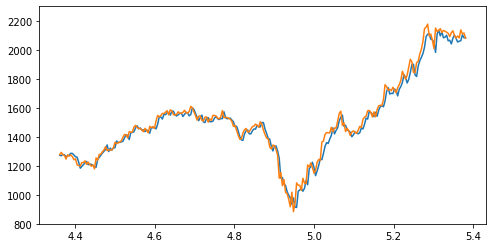

Test epoch:200 	Loss: 0.223292


In [ ]:
path = os.path.join('/content/', 'output')
os.makedirs(path, exist_ok=True)
train_losses = []
test_losses = []
for epoch in range(1, args.epochs + 1):
    train_losses.append(train(epoch))
    test_losses.append(test(epoch))
    if epoch in args.decreasing_lr:
        for param_group in optimizer_F.param_groups:
            param_group['lr'] *= args.droprate

    if epoch in args.decreasing_lr2:
        for param_group in optimizer_G.param_groups:
            param_group['lr'] *= args.droprate

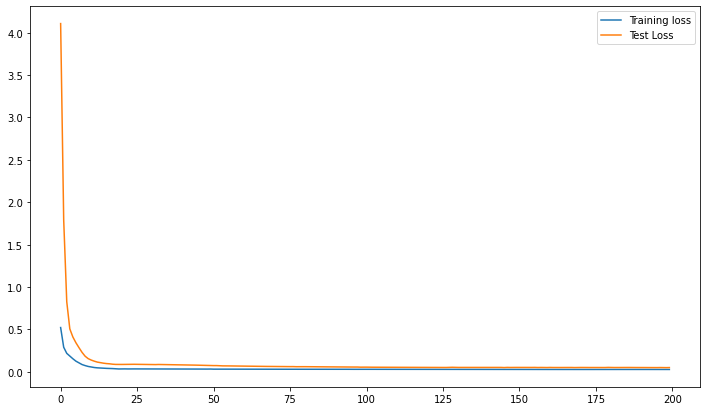

0.049859326


In [ ]:
plt.figure(figsize=(12,7))
plt.plot(train_losses)
plt.plot(test_losses)
plt.legend(('Training loss','Test Loss'))
plt.savefig(os.path.join('/content/output/','Loss'), dpi=300)
plt.show()
print(test_losses[-1])

# **Download DATA**

In [ ]:
# for i in range(0,1000, 50):
#   !mv "/global_step_{i}.png" "/content/output"
# !mv "/prior.png" "/content/output"
!zip -r /content/SDE_Iteration5_MSE_.zip /content/output

files.download("/content/SDE_Iteration5_MSE_.zip")

  adding: content/output/ (stored 0%)
  adding: content/output/train_110.png (deflated 7%)
  adding: content/output/train_188.png (deflated 7%)
  adding: content/output/test_197.png (deflated 9%)
  adding: content/output/test_196.png (deflated 9%)
  adding: content/output/test_152.png (deflated 9%)
  adding: content/output/test_105.png (deflated 9%)
  adding: content/output/test_68.png (deflated 9%)
  adding: content/output/train_119.png (deflated 7%)
  adding: content/output/train_22.png (deflated 7%)
  adding: content/output/train_29.png (deflated 7%)
  adding: content/output/test_199.png (deflated 9%)
  adding: content/output/test_178.png (deflated 9%)
  adding: content/output/train_21.png (deflated 7%)
  adding: content/output/train_130.png (deflated 7%)
  adding: content/output/test_166.png (deflated 9%)
  adding: content/output/train_80.png (deflated 7%)
  adding: content/output/test_144.png (deflated 9%)
  adding: content/output/test_98.png (deflated 9%)
  adding: content/output

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **Delete Previous DATA**

In [ ]:
!rm -rf "/content/output/"